#### Continuition of codes for Github and project sharing

# Ouest Department

#### Creating DataFrame for Ouest

In [137]:
df_Ouest= df_HaitiLoc_copy[df_HaitiLoc_copy['Department']=='OUEST'].reset_index(drop=True)
print(df_Ouest.shape)
df_Ouest.head()

(726, 9)


,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-1,SOGEBANK PLACE GEFFRARD I,PLACE GEFFRARD I,13 RUE DES MIRACLES,PORT AU PRINCE,OUEST,0.000000,0.000000,1
1,HT1-2,SOGEBANK RUE PAVEE,ANGLE RUES PAVEE ET MGR GUILLOUX,,PORT AU PRINCE,OUEST,0.000000,0.000000,1
2,HT1-3,SOGEBANK DELMAS AEROPORT,"27, BOULEVARD TOUSSAINT LOUVER",IMMEUBLE SOGEFAC,DELMAS,OUEST,18.555463,-72.314754,1
3,HT1-4,SOGEBANK AEROPORT I,BLVD TOUSSAINT LOUVERTURE,,PORT AU PRINCE,OUEST,18.564786,-72.313508,1
4,HT1-5,SOGEBANK AEROPORT II,AEROPORT II,ROUTE AEROPORT EN FACE DU PARC,PORT AU PRINCE,OUEST,0.000000,0.000000,1


In [138]:
address_Ouest = 'Ouest Haiti'

geolocator_Ouest = Nominatim(user_agent="Ouest_explorer")
location_Ouest = geolocator_Ouest.geocode(address_Ouest)
latitude_Ouest = location_Ouest.latitude
longitude_Ouest = location_Ouest.longitude
print('The geograpical coordinates of Ouest are {}, {}.'.format(latitude_Ouest, longitude_Ouest))

The geograpical coordinates of Ouest are 19.8469434, -73.0589966.


#### Unfortunately the coordinates obtained are not correct and will use the ones obtained from Google maps

In [139]:
latitude_Ouest = 18.593017052243265
longitude_Ouest = -72.30883896723941

#### Creating location map for Ouest

In [167]:
map_Haiti_Ouest = folium.Map(location=[latitude_Ouest, longitude_Ouest], zoom_start=11)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Ouest['Latitude'], df_Ouest['Longitude'], df_Ouest['Name'], df_Ouest['Country Code'], df_Ouest['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Ouest)  
    
map_Haiti_Ouest

#### Setting values for Foursquare request

In [142]:
radius_Ouest = 100000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_Ouest, 
    longitude_Ouest, 
    radius_Ouest, 
    LIMIT)

#### Obtaining nearby venues

In [143]:
Results_Ouest = requests.get(url_venues_Haiti).json()
Results_Ouest

{'meta': {'code': 200, 'requestId': '5fd66f43e4e5a913aebe78b8'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Port-au-Prince',
  'headerFullLocation': 'Port-au-Prince',
  'headerLocationGranularity': 'city',
  'totalResults': 59,
  'suggestedBounds': {'ne': {'lat': 19.493017952244166,
    'lng': -71.36105082736692},
   'sw': {'lat': 17.693016152242365, 'lng': -73.2566271071119}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4d2efabea6df6dcb6770de7a',
       'name': 'Marie Beliard',
       'location': {'address': 'Angles rue Faubert & Lambert',
        'crossStreet': '109',
        'lat': 18.516035653294164,
        'lng': -72.28845501062598,
        'labeledLatLngs': [{'label

In [144]:
Ouest_Venues = Results_Ouest['response']['groups'][0]['items']
nearby_venues_Ouest = json_normalize(Ouest_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_Ouest = nearby_venues_Ouest.loc[:,filtered_columns]

nearby_venues_Ouest['venue.categories'] = nearby_venues_Ouest.apply(get_category_type, axis=1)

nearby_venues_Ouest.columns = [col.split(".")[-1] for col in nearby_venues_Ouest.columns]


nearby_venues_Ouest.head()

<ipython-input-144-a6e5f03b9684>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_Ouest = json_normalize(Ouest_Venues)


,name,categories,lat,lng
0,Marie Beliard,Bakery,18.516036,-72.288455
1,ASU ROOFTOP Lounge,Lounge,18.521174,-72.300220
2,Rebo Expresso,Coffee Shop,18.512118,-72.283136
3,Patisserie Ste Claire,Bakery,18.535652,-72.320370
4,5 Coins (Centre Ville),Restaurant,18.533747,-72.340001


In [145]:
nearby_venues_Ouest.shape

(59, 4)

In [146]:
nearby_venues_Ouest.groupby('categories').count()

,name,lat,lng
categories,,,
Arepa Restaurant,1,1,1
Arts & Crafts Store,1,1,1
BBQ Joint,1,1,1
Bakery,2,2,2
Bar,2,2,2
Beach,1,1,1
Bookstore,1,1,1
Buffet,1,1,1
Caribbean Restaurant,1,1,1


In [147]:
nearby_venues_Ouest.groupby('categories').count().shape

(35, 3)

In [148]:
print('There are {} unique categories.'.format(len(nearby_venues_Ouest['categories'].unique())))

There are 35 unique categories.


#### Creating map with locations and venues

In [149]:
map_Haiti_Ouest_venues = folium.Map(location=[latitude_Ouest, longitude_Ouest], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Ouest['Latitude'], df_Ouest['Longitude'], df_Ouest['Name'], df_Ouest['Country Code'], df_Ouest['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Ouest_venues)  

for lat, lng, label in zip(nearby_venues_Ouest['lat'], nearby_venues_Ouest['lng'], nearby_venues_Ouest['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_Ouest_venues)  
        
map_Haiti_Ouest_venues

#### Creating map with venues, locations and population

In [150]:
map_Haiti_Ouest_venues2 = folium.Map(location=[latitude_Ouest, longitude_Ouest], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Ouest['Latitude'], df_Ouest['Longitude'], df_Ouest['Name'], df_Ouest['Country Code'], df_Ouest['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Ouest_venues2)  

for lat, lng, label in zip(nearby_venues_Ouest['lat'], nearby_venues_Ouest['lng'], nearby_venues_Ouest['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_Ouest_venues2)  

map_Haiti_Ouest_venues2.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )
    
    
map_Haiti_Ouest_venues2

In [151]:
nearby_venues_Ouest.head()

,name,categories,lat,lng
0,Marie Beliard,Bakery,18.516036,-72.288455
1,ASU ROOFTOP Lounge,Lounge,18.521174,-72.300220
2,Rebo Expresso,Coffee Shop,18.512118,-72.283136
3,Patisserie Ste Claire,Bakery,18.535652,-72.320370
4,5 Coins (Centre Ville),Restaurant,18.533747,-72.340001


#### One hot code for Clusters

In [152]:
# one hot encoding
Ouest_onehot = pd.get_dummies(nearby_venues_Ouest[['categories']], prefix="", prefix_sep="")
Ouest_onehot.head()

,Arepa Restaurant,Arts & Crafts Store,BBQ Joint,Bakery,Bar,Beach,Bookstore,Buffet,Caribbean Restaurant,Chinese Restaurant,Cocktail Bar,Coffee Shop,Diner,Eastern European Restaurant,Electronics Store,Fast Food Restaurant,Food & Drink Shop,Gym / Fitness Center,Hotel,Hotel Bar,Ice Cream Shop,Italian Restaurant,Japanese Restaurant,Latin American Restaurant,Lounge,Mediterranean Restaurant,New American Restaurant,Nightclub,Park,Pizza Place,Resort,Restaurant,Seafood Restaurant,Supermarket,Theme Park
0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


#### Elbow method to identify best K

In [153]:
distortions_Ouest = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(Ouest_onehot)
    distortions_Ouest.append(kmeanModel.inertia_)

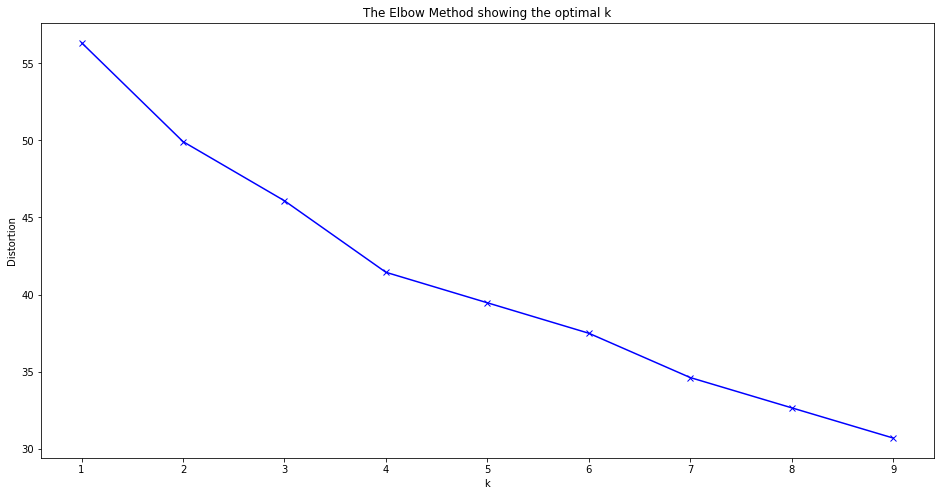

In [154]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_Ouest, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [155]:
kclusters = 3

Ouest_grouped_clustering = Ouest_onehot#.drop('City', 1)

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Ouest_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 0, 0, 0, 2, 0, 0, 1, 0, 0])

#### Adding Clusters to DataFrame

In [156]:
nearby_venues_Ouest.insert(0, 'Cluster Labels', kmeans.labels_)
nearby_venues_Ouest.head()

,Cluster Labels,name,categories,lat,lng
0,0,Marie Beliard,Bakery,18.516036,-72.288455
1,0,ASU ROOFTOP Lounge,Lounge,18.521174,-72.300220
2,0,Rebo Expresso,Coffee Shop,18.512118,-72.283136
3,0,Patisserie Ste Claire,Bakery,18.535652,-72.320370
4,2,5 Coins (Centre Ville),Restaurant,18.533747,-72.340001


#### Creating DataFrame for each cluster and using bar plot to review categories for each cluster

In [157]:
cluster_ouest0=nearby_venues_Ouest[nearby_venues_Ouest['Cluster Labels']==0]
cluster_ouest0.head()

,Cluster Labels,name,categories,lat,lng
0,0,Marie Beliard,Bakery,18.516036,-72.288455
1,0,ASU ROOFTOP Lounge,Lounge,18.521174,-72.300220
2,0,Rebo Expresso,Coffee Shop,18.512118,-72.283136
3,0,Patisserie Ste Claire,Bakery,18.535652,-72.320370
5,0,Star2000,Supermarket,18.549621,-72.308625


In [158]:
cluster_ouest0_plot=cluster_ouest0.groupby('categories').count()
cluster_ouest0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Arepa Restaurant,1,1,1,1
Arts & Crafts Store,1,1,1,1
BBQ Joint,1,1,1,1
Bakery,2,2,2,2
Bar,2,2,2,2


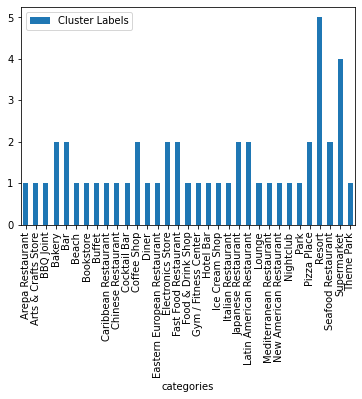

In [159]:
cluster_ouest0_plot[['Cluster Labels']].plot(kind='bar')

plt.show()

In [160]:
cluster_ouest1=nearby_venues_Ouest[nearby_venues_Ouest['Cluster Labels']==1]
cluster_ouest1.head()

,Cluster Labels,name,categories,lat,lng
7,1,Karibe Hotel,Hotel,18.521091,-72.300851
10,1,Visa Lodge,Hotel,18.568641,-72.302239
31,1,Executive Villas,Hotel,18.554892,-72.242986
33,1,Best Western Premier Petion-Ville,Hotel,18.512712,-72.284974
48,1,Hostal Doña Chava,Hotel,18.035905,-71.742391


In [161]:
cluster_ouest1_plot=cluster_ouest1.groupby('categories').count()
cluster_ouest1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Hotel,7,7,7,7


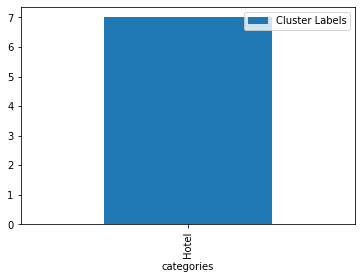

In [162]:
cluster_ouest1_plot[['Cluster Labels']].plot(kind='bar')

plt.show()

In [163]:
cluster_ouest2=nearby_venues_Ouest[nearby_venues_Ouest['Cluster Labels']==2]
cluster_ouest2.head()

,Cluster Labels,name,categories,lat,lng
4,2,5 Coins (Centre Ville),Restaurant,18.533747,-72.340001
42,2,La Reserve,Restaurant,18.508037,-72.282750
53,2,Tiz Bar Resto,Restaurant,18.428709,-73.079952


In [164]:
cluster_ouest2_plot=cluster_ouest2.groupby('categories').count()
cluster_ouest2_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Restaurant,3,3,3,3


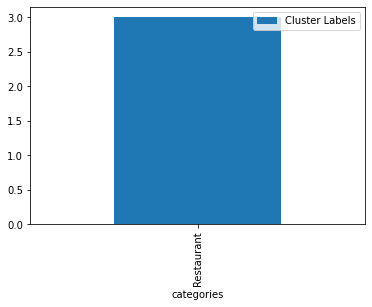

In [165]:
cluster_ouest2_plot[['Cluster Labels']].plot(kind='bar')

plt.show()

#### Renaming clusters in DataFrame

In [166]:
nearby_venues_Ouest2=nearby_venues_Ouest.copy()
nearby_venues_Ouest2['Cluster Labels']=nearby_venues_Ouest2['Cluster Labels'].replace(0,'Resort and Supermarkets')
nearby_venues_Ouest2['Cluster Labels']=nearby_venues_Ouest2['Cluster Labels'].replace(1,'Hotels')
nearby_venues_Ouest2['Cluster Labels']=nearby_venues_Ouest2['Cluster Labels'].replace(2,'Restaurants')
nearby_venues_Ouest2.head()

,Cluster Labels,name,categories,lat,lng
0,Resort and Supermarkets,Marie Beliard,Bakery,18.516036,-72.288455
1,Resort and Supermarkets,ASU ROOFTOP Lounge,Lounge,18.521174,-72.300220
2,Resort and Supermarkets,Rebo Expresso,Coffee Shop,18.512118,-72.283136
3,Resort and Supermarkets,Patisserie Ste Claire,Bakery,18.535652,-72.320370
4,Restaurants,5 Coins (Centre Ville),Restaurant,18.533747,-72.340001


#### Create map with population, locations and venues clusters

In [247]:
# create map
Ouest_map_clusters = folium.Map(location=[latitude_Ouest, longitude_Ouest], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##
    
for lat, lng, label, label2, activity in zip(df_Ouest['Latitude'], df_Ouest['Longitude'], df_Ouest['Name'], df_Ouest['Country Code'], df_Ouest['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(Ouest_map_clusters)  

Ouest_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_Ouest['lat'], nearby_venues_Ouest['lng'], nearby_venues_Ouest['categories'], nearby_venues_Ouest['Cluster Labels'], nearby_venues_Ouest['name'], nearby_venues_Ouest2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(Ouest_map_clusters)       

Ouest_map_clusters

### Follow same steps from Ouest Department in all the other 9 Departments below

# Artibonite Department

In [168]:
df_Artibonite= df_HaitiLoc_copy[df_HaitiLoc_copy['Department']=='ARTIBONITE'].reset_index(drop=True)
print(df_Artibonite.shape)
df_Artibonite.head()

(144, 9)


,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-16,SOGEBANK ST MARC,"183, RUE LOUVERTURE",,SAINT MARC,ARTIBONITE,19.108352,-72.701153,0
1,HT1-17,SOGEBANK GONAIVES I,RUE JEAN-JACQUES ET RUE T. LOU,,GONAIVES,ARTIBONITE,19.447981,-72.694633,1
2,HT1-25,AGENCE REFERENCE 2000,GONAIVES,,GONAIVES,ARTIBONITE,0.000000,0.000000,1
3,HT1-33,SOGEXPRESS ST MARC,183 RUE LOUVERTURE,,SAINT MARC,ARTIBONITE,0.000000,0.000000,1
4,HT1-76,DGS COMMUNICATION GROS MORNE,ROUTE NATIONALE NUMERO 1,,GROS MORNE,ARTIBONITE,0.000000,0.000000,1


In [169]:
latitude_Artibonite = 19.436526
longitude_Artibonite = -72.575746

In [170]:
map_Haiti_Artibonite = folium.Map(location=[latitude_Artibonite, longitude_Artibonite], zoom_start=10)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Artibonite['Latitude'], df_Artibonite['Longitude'], df_Artibonite['Name'], df_Artibonite['Country Code'], df_Artibonite['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)  
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Artibonite)  
    
map_Haiti_Artibonite

In [171]:
radius_Artibonite=50000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_Artibonite, 
    longitude_Artibonite, 
    radius_Artibonite, 
    LIMIT)

In [172]:
Results_Artibonite = requests.get(url_venues_Haiti).json()
Results_Artibonite

{'meta': {'code': 200, 'requestId': '5fd6732ab8aa6d5abde1b699'},
 'response': {'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 6,
  'suggestedBounds': {'ne': {'lat': 19.88652645000045,
    'lng': -72.09944149885447},
   'sw': {'lat': 18.986525549999552, 'lng': -73.05205050114552}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4e6bdb40b61c739ba84cd7e9',
       'name': 'Citadelle La Ferrière',
       'location': {'address': 'Milot',
        'lat': 19.57349831129896,
        'lng': -72.24386215209961,
        'labeledLatLngs': [{'label': 'display',
          'lat': 19.57349831129896,
          'lng': -72.24386215209961}],
        'distance': 38016,
        'cc': 'HT',
        'c

In [173]:
Artibonite_Venues = Results_Artibonite ['response']['groups'][0]['items']
nearby_venues_Artibonite = json_normalize(Artibonite_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_Artibonite = nearby_venues_Artibonite.loc[:,filtered_columns]

nearby_venues_Artibonite ['venue.categories'] = nearby_venues_Artibonite.apply(get_category_type, axis=1)

nearby_venues_Artibonite.columns = [col.split(".")[-1] for col in nearby_venues_Artibonite.columns]

print(nearby_venues_Artibonite.shape)

nearby_venues_Artibonite.head()

(6, 4)


<ipython-input-173-f369ba922a12>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_Artibonite = json_normalize(Artibonite_Venues)


,name,categories,lat,lng
0,Citadelle La Ferrière,Historic Site,19.573498,-72.243862
1,Celeste Bar Resto,Restaurant,19.447856,-72.690723
2,Coin D'or,Fast Food Restaurant,19.455900,-72.678370
3,Kay Foun,New American Restaurant,19.106901,-72.697795
4,Ennery,Campground,19.488505,-72.485965


In [174]:
nearby_venues_Artibonite['categories']=nearby_venues_Artibonite['categories'].replace('Fast Food Restaurant','Restaurant')
nearby_venues_Artibonite['categories']=nearby_venues_Artibonite['categories'].replace('New American Restaurant','Restaurant')

In [175]:
nearby_venues_Artibonite.groupby('categories').count()

,name,lat,lng
categories,,,
Campground,1,1,1
Historic Site,1,1,1
Plaza,1,1,1
Restaurant,3,3,3


In [176]:
nearby_venues_Artibonite.groupby('categories').count().shape

(4, 3)

In [177]:
print('There are {} unique categories.'.format(len(nearby_venues_Artibonite['categories'].unique())))

There are 4 unique categories.


In [178]:
map_Haiti_Artibonite_venues = folium.Map(location=[latitude_Artibonite, longitude_Artibonite], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Artibonite['Latitude'], df_Artibonite['Longitude'], df_Artibonite['Name'], df_Artibonite['Country Code'], df_Artibonite['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Artibonite_venues)  

for lat, lng, label in zip(nearby_venues_Artibonite['lat'], nearby_venues_Artibonite['lng'], nearby_venues_Artibonite['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_Artibonite_venues)  
        
map_Haiti_Artibonite_venues

In [179]:
map_Haiti_Artibonite_venues2 = folium.Map(location=[latitude_Artibonite, longitude_Artibonite], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Artibonite['Latitude'], df_Artibonite['Longitude'], df_Artibonite['Name'], df_Artibonite['Country Code'], df_Artibonite['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Artibonite_venues2)  

for lat, lng, label in zip(nearby_venues_Artibonite['lat'], nearby_venues_Artibonite['lng'], nearby_venues_Artibonite['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_Artibonite_venues2)  

map_Haiti_Artibonite_venues2.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )
    
    
map_Haiti_Artibonite_venues2

In [180]:
Artibonite_onehot = pd.get_dummies(nearby_venues_Artibonite[['categories']], prefix="", prefix_sep="")

Artibonite_onehot.head()

,Campground,Historic Site,Plaza,Restaurant
0,0,1,0,0
1,0,0,0,1
2,0,0,0,1
3,0,0,0,1
4,1,0,0,0


In [185]:
distortions_Artibonite = []
K = range(1,6)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(Artibonite_onehot)
    distortions_Artibonite.append(kmeanModel.inertia_)

<ipython-input-185-ca8d1ad6d016>:5: ConvergenceWarning: Number of distinct clusters (4) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  kmeanModel.fit(Artibonite_onehot)


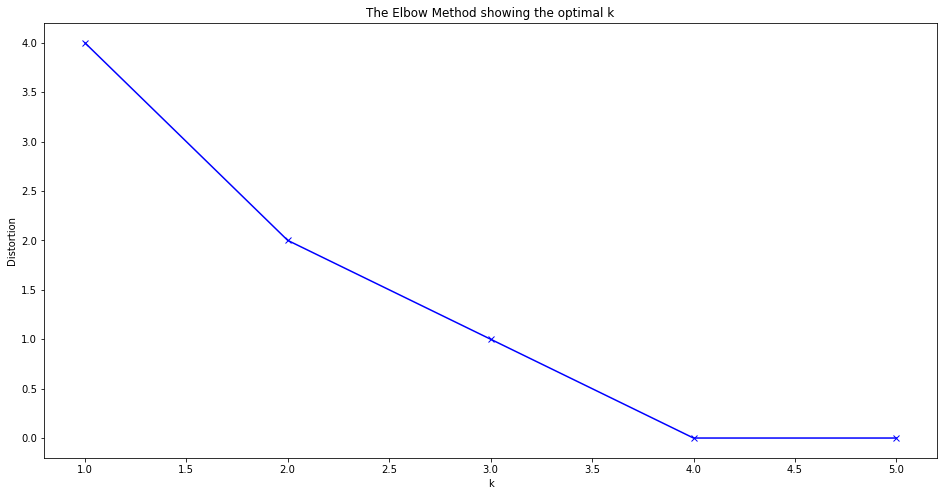

In [186]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_Artibonite, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [187]:
kclusters = 2

Artibonite_grouped_clustering = Artibonite_onehot

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Artibonite_grouped_clustering)

kmeans.labels_[0:10]

array([0, 1, 1, 1, 0, 0])

In [188]:
nearby_venues_Artibonite.insert(0, 'Cluster Labels', kmeans.labels_)

nearby_venues_Artibonite.head()

,Cluster Labels,name,categories,lat,lng
0,0,Citadelle La Ferrière,Historic Site,19.573498,-72.243862
1,1,Celeste Bar Resto,Restaurant,19.447856,-72.690723
2,1,Coin D'or,Restaurant,19.455900,-72.678370
3,1,Kay Foun,Restaurant,19.106901,-72.697795
4,0,Ennery,Campground,19.488505,-72.485965


In [189]:
cluster_artibonite0=nearby_venues_Artibonite[nearby_venues_Artibonite['Cluster Labels']==0]
cluster_artibonite0.head()

,Cluster Labels,name,categories,lat,lng
0,0,Citadelle La Ferrière,Historic Site,19.573498,-72.243862
4,0,Ennery,Campground,19.488505,-72.485965
5,0,Place d'Armes Des Gonaives,Plaza,19.445760,-72.690770


In [190]:
cluster_artibonite0_plot=cluster_artibonite0.groupby('categories').count()
cluster_artibonite0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Campground,1,1,1,1
Historic Site,1,1,1,1
Plaza,1,1,1,1


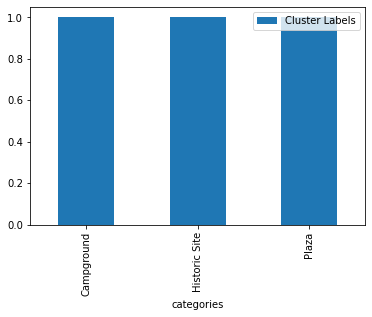

In [191]:
cluster_artibonite0_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [192]:
cluster_artibonite1=nearby_venues_Artibonite[nearby_venues_Artibonite['Cluster Labels']==1]
cluster_artibonite1.head()

,Cluster Labels,name,categories,lat,lng
1,1,Celeste Bar Resto,Restaurant,19.447856,-72.690723
2,1,Coin D'or,Restaurant,19.455900,-72.678370
3,1,Kay Foun,Restaurant,19.106901,-72.697795


In [193]:
cluster_artibonite1_plot=cluster_artibonite1.groupby('categories').count()
cluster_artibonite1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Restaurant,3,3,3,3


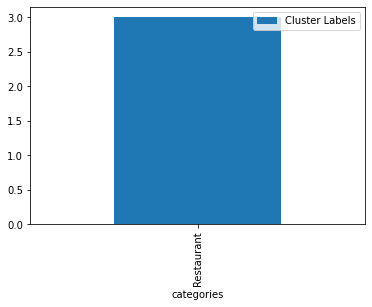

In [194]:
cluster_artibonite1_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [195]:
nearby_venues_Artibonite2=nearby_venues_Artibonite.copy()
nearby_venues_Artibonite2['Cluster Labels']=nearby_venues_Artibonite2['Cluster Labels'].replace(0,'Outdoors activity')
nearby_venues_Artibonite2['Cluster Labels']=nearby_venues_Artibonite2['Cluster Labels'].replace(1,'Restaurants')
nearby_venues_Artibonite2.head()

,Cluster Labels,name,categories,lat,lng
0,Outdoors activity,Citadelle La Ferrière,Historic Site,19.573498,-72.243862
1,Restaurants,Celeste Bar Resto,Restaurant,19.447856,-72.690723
2,Restaurants,Coin D'or,Restaurant,19.455900,-72.678370
3,Restaurants,Kay Foun,Restaurant,19.106901,-72.697795
4,Outdoors activity,Ennery,Campground,19.488505,-72.485965


In [198]:
# create map
Artibonite_map_clusters = folium.Map(location=[latitude_Artibonite, longitude_Artibonite], zoom_start=9)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##
    
for lat, lng, label, label2, activity in zip(df_Artibonite['Latitude'], df_Artibonite['Longitude'], df_Artibonite['Name'], df_Artibonite['Country Code'], df_Artibonite['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(Artibonite_map_clusters)  

Artibonite_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_Artibonite['lat'], nearby_venues_Artibonite['lng'], nearby_venues_Artibonite['categories'], nearby_venues_Artibonite['Cluster Labels'], nearby_venues_Artibonite['name'], nearby_venues_Artibonite2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(Artibonite_map_clusters)       

Artibonite_map_clusters

# Centre Department

In [196]:
df_Centre= df_HaitiLoc_copy[df_HaitiLoc_copy['Department']=='CENTRE'].reset_index(drop=True)
print(df_Centre.shape)
df_Centre.head()

(31, 9)


,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-105,DGS HINCHE,96 RUE STENIO VINCENT,,HINCHE,CENTRE,0.0,0.0,1
1,HT1-116,HENRY NET CYBER CAFE,169 RUE CLAIRE HEUREUSE,RUE CLAIRE HEUREUSE MIREBALAIS,MIREBALAIS,CENTRE,0.0,0.0,1
2,HT1-163,DGS BELLADERES,BELLADERES,,BELLADERE,CENTRE,0.0,0.0,1
3,HT1-189,SCHILO PHARMACIE,LASCAHOBAS,,LASCAHOBAS,CENTRE,0.0,0.0,1
4,HT1-194,SOGEBANK MIREBALAIS,MIREBALAIS,,MIREBALAIS,CENTRE,0.0,0.0,0


In [197]:
latitude_Centre = 19.014112
longitude_Centre = -71.973257

In [199]:
map_Haiti_Centre = folium.Map(location=[latitude_Centre, longitude_Centre], zoom_start=11)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Centre['Latitude'], df_Centre['Longitude'], df_Centre['Name'], df_Centre['Country Code'], df_Centre['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Centre)  
    
map_Haiti_Centre

In [200]:
radius_Centre=40000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_Centre, 
    longitude_Centre, 
    radius_Centre, 
    LIMIT)

In [201]:
Results_Centre = requests.get(url_venues_Haiti).json()
Results_Centre

{'meta': {'code': 200, 'requestId': '5fd6c5e9ea3ff877cfe922f1'},
 'response': {'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 5,
  'suggestedBounds': {'ne': {'lat': 19.37411236000036,
    'lng': -71.59319182215201},
   'sw': {'lat': 18.65411163999964, 'lng': -72.353322177848}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '5289678c11d22424bde8f089',
       'name': 'Maguana Hotel',
       'location': {'lat': 19.173214938250894,
        'lng': -71.98137432239665,
        'labeledLatLngs': [{'label': 'display',
          'lat': 19.173214938250894,
          'lng': -71.98137432239665}],
        'distance': 17731,
        'cc': 'HT',
        'country': 'Ayiti',
        'formattedA

In [202]:
Centre_Venues = Results_Centre ['response']['groups'][0]['items']
nearby_venues_Centre = json_normalize(Centre_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_Centre = nearby_venues_Centre.loc[:,filtered_columns]

nearby_venues_Centre ['venue.categories'] = nearby_venues_Centre.apply(get_category_type, axis=1)

nearby_venues_Centre.columns = [col.split(".")[-1] for col in nearby_venues_Centre.columns]

print(nearby_venues_Centre.shape)

nearby_venues_Centre.head()

(5, 4)


<ipython-input-202-2a0b13bea912>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_Centre = json_normalize(Centre_Venues)


,name,categories,lat,lng
0,Maguana Hotel,Hotel,19.173215,-71.981374
1,Wozo Plaza Hotel,Hotel,18.847140,-72.081423
2,Riviere Fer A Cheval,River,18.836615,-72.083535
3,Place Mirebalais,Park,18.834201,-72.104150
4,Parque Elias Piña,Park,18.876661,-71.702968


In [203]:
nearby_venues_Centre.groupby('categories').count()

,name,lat,lng
categories,,,
Hotel,2,2,2
Park,2,2,2
River,1,1,1


In [204]:
nearby_venues_Centre.groupby('categories').count().shape

(3, 3)

In [205]:
print('There are {} unique categories.'.format(len(nearby_venues_Centre['categories'].unique())))

There are 3 unique categories.


In [206]:
map_Haiti_Centre_venues = folium.Map(location=[latitude_Centre, longitude_Centre], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Centre['Latitude'], df_Centre['Longitude'], df_Centre['Name'], df_Centre['Country Code'], df_Centre['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Centre_venues)  

for lat, lng, label in zip(nearby_venues_Centre['lat'], nearby_venues_Centre['lng'], nearby_venues_Centre['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_Centre_venues)  
        
map_Haiti_Centre_venues

In [207]:
map_Haiti_Centre_venues2 = folium.Map(location=[latitude_Centre, longitude_Centre], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Centre['Latitude'], df_Centre['Longitude'], df_Centre['Name'], df_Centre['Country Code'], df_Centre['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Centre_venues2)  

for lat, lng, label in zip(nearby_venues_Centre ['lat'], nearby_venues_Centre ['lng'], nearby_venues_Centre ['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_Centre_venues2)  

map_Haiti_Centre_venues2.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )
    
    
map_Haiti_Centre_venues2

In [208]:
Centre_onehot = pd.get_dummies(nearby_venues_Centre[['categories']], prefix="", prefix_sep="")

Centre_onehot.head()

,Hotel,Park,River
0,1,0,0
1,1,0,0
2,0,0,1
3,0,1,0
4,0,1,0


In [209]:
distortions_Centre = []
K = range(1,4)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(Centre_onehot)
    distortions_Centre.append(kmeanModel.inertia_)

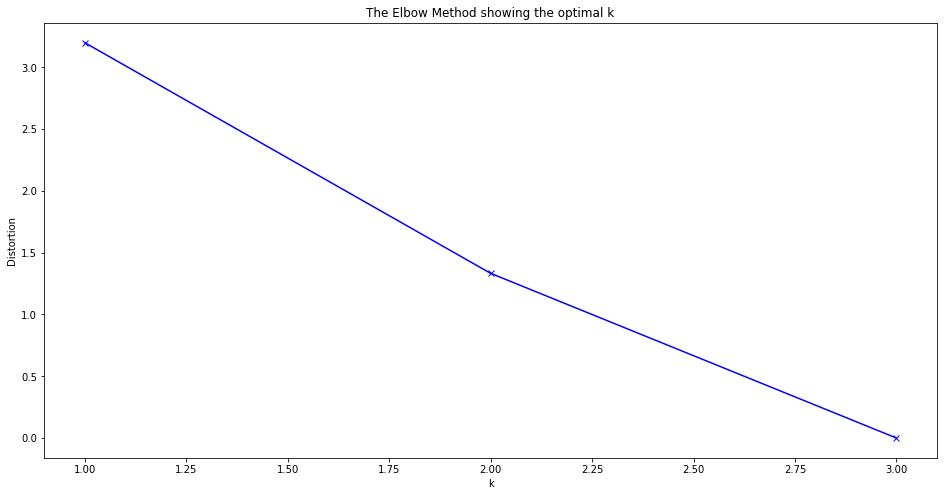

In [210]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_Centre, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [211]:
kclusters = 2

Centre_grouped_clustering = Centre_onehot

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Centre_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]


array([1, 1, 0, 0, 0])

In [212]:
nearby_venues_Centre.insert(0, 'Cluster Labels', kmeans.labels_)
nearby_venues_Centre.head()

,Cluster Labels,name,categories,lat,lng
0,1,Maguana Hotel,Hotel,19.173215,-71.981374
1,1,Wozo Plaza Hotel,Hotel,18.847140,-72.081423
2,0,Riviere Fer A Cheval,River,18.836615,-72.083535
3,0,Place Mirebalais,Park,18.834201,-72.104150
4,0,Parque Elias Piña,Park,18.876661,-71.702968


In [213]:
cluster_centre0=nearby_venues_Centre[nearby_venues_Centre['Cluster Labels']==0]
cluster_centre0.head()

,Cluster Labels,name,categories,lat,lng
2,0,Riviere Fer A Cheval,River,18.836615,-72.083535
3,0,Place Mirebalais,Park,18.834201,-72.104150
4,0,Parque Elias Piña,Park,18.876661,-71.702968


In [214]:
cluster_centre0_plot=cluster_centre0.groupby('categories').count()
cluster_centre0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Park,2,2,2,2
River,1,1,1,1


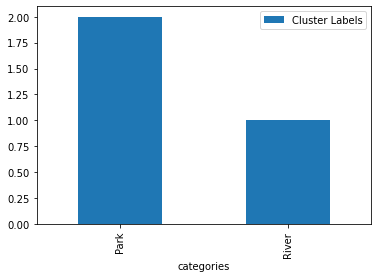

In [215]:
cluster_centre0_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [216]:
cluster_centre1=nearby_venues_Centre[nearby_venues_Centre['Cluster Labels']==1]
cluster_centre1.head()

,Cluster Labels,name,categories,lat,lng
0,1,Maguana Hotel,Hotel,19.173215,-71.981374
1,1,Wozo Plaza Hotel,Hotel,18.847140,-72.081423


In [217]:
cluster_centre1_plot=cluster_centre1.groupby('categories').count()
cluster_centre1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Hotel,2,2,2,2


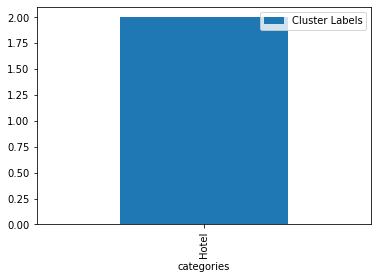

In [218]:
cluster_centre1_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [219]:
nearby_venues_Centre2=nearby_venues_Centre.copy()
nearby_venues_Centre2['Cluster Labels']=nearby_venues_Centre2['Cluster Labels'].replace(0,'Outdoors activity')
nearby_venues_Centre2['Cluster Labels']=nearby_venues_Centre2['Cluster Labels'].replace(1,'Hotels')
nearby_venues_Centre2.head()

,Cluster Labels,name,categories,lat,lng
0,Hotels,Maguana Hotel,Hotel,19.173215,-71.981374
1,Hotels,Wozo Plaza Hotel,Hotel,18.847140,-72.081423
2,Outdoors activity,Riviere Fer A Cheval,River,18.836615,-72.083535
3,Outdoors activity,Place Mirebalais,Park,18.834201,-72.104150
4,Outdoors activity,Parque Elias Piña,Park,18.876661,-71.702968


In [220]:
Centre_map_clusters = folium.Map(location=[latitude_Centre, longitude_Centre], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##
    
for lat, lng, label, label2, activity in zip(df_Centre['Latitude'], df_Centre['Longitude'], df_Centre['Name'], df_Centre['Country Code'], df_Centre['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(Centre_map_clusters)  

Centre_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_Centre['lat'], nearby_venues_Centre['lng'], nearby_venues_Centre['categories'], nearby_venues_Centre['Cluster Labels'], nearby_venues_Centre['name'], nearby_venues_Centre2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(Centre_map_clusters)       

Centre_map_clusters

# Grand'Anse Department

In [222]:
df_GrandAnse= df_HaitiLoc_copy[df_HaitiLoc_copy['Department']== 'GRAND\'ANSE'].reset_index(drop=True)
print(df_GrandAnse.shape)
df_GrandAnse.head()

(16, 9)


,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-71,L OISEAU CYBER CAFE,ROUTE NATIONALE 2,,DAME MARIE,GRAND'ANSE,18.560625,-74.419303,1
1,HT1-90,SOGEBANK JEREMIE,GRAND RUE,,JEREMIE,GRAND'ANSE,0.000000,0.000000,0
2,HT1-92,SOGEXPRESS JEREMIE,JEREMIE,,JEREMIE,GRAND'ANSE,0.000000,0.000000,1
3,HT1-203,DEPOT PA NOU,"11,RUE GEFFRARD DAME MARIE",,DAME MARIE,GRAND'ANSE,0.000000,0.000000,1
4,HT1-243,LORY CONFORT 2,"25,RUE HORTENSIUS MERLET",SUR LA PLACE DE LA CATHEDRALE,JEREMIE,GRAND'ANSE,18.645005,-74.113884,0


In [223]:
latitude_GrandAnse = 18.542989
longitude_GrandAnse = -74.192710

In [224]:
map_Haiti_GrandAnse= folium.Map(location=[latitude_GrandAnse, longitude_GrandAnse], zoom_start=11)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_GrandAnse['Latitude'], df_GrandAnse['Longitude'], df_GrandAnse['Name'], df_GrandAnse['Country Code'], df_GrandAnse['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_GrandAnse)  
    
map_Haiti_GrandAnse

In [225]:
radius_GrandAnse = 30000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_GrandAnse, 
    longitude_GrandAnse, 
    radius_GrandAnse, 
    LIMIT)

In [226]:
Results_GrandAnse = requests.get(url_venues_Haiti).json()
Results_GrandAnse

{'meta': {'code': 200, 'requestId': '5fd6c83e4bf6557d353cbd96'},
 'response': {'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 6,
  'suggestedBounds': {'ne': {'lat': 18.81298927000027,
    'lng': -73.9084569434346},
   'sw': {'lat': 18.272988729999728, 'lng': -74.47696305656541}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '5079eb5be4b0c101c6947ca8',
       'name': 'Carrefour Bac Jeremie',
       'location': {'address': 'Route Jeremie',
        'lat': 18.6344273034745,
        'lng': -74.1102059578409,
        'labeledLatLngs': [{'label': 'display',
          'lat': 18.6344273034745,
          'lng': -74.1102059578409}],
        'distance': 13393,
        'cc': 'HT',
       

In [227]:
GrandAnse_Venues = Results_GrandAnse ['response']['groups'][0]['items']
nearby_venues_GrandAnse = json_normalize(GrandAnse_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_GrandAnse = nearby_venues_GrandAnse.loc[:,filtered_columns]

nearby_venues_GrandAnse ['venue.categories'] = nearby_venues_GrandAnse.apply(get_category_type, axis=1)

nearby_venues_GrandAnse.columns = [col.split(".")[-1] for col in nearby_venues_GrandAnse.columns]

print(nearby_venues_GrandAnse.shape)

nearby_venues_GrandAnse.head()

(6, 4)


<ipython-input-227-c2b3dcd2dfce>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_GrandAnse = json_normalize(GrandAnse_Venues)


,name,categories,lat,lng
0,Carrefour Bac Jeremie,Bus Station,18.634427,-74.110206
1,Parc Santa Helena,Soccer Field,18.638556,-74.114824
2,Jeremie Airport,Airport,18.662799,-74.170899
3,Romelo's Sur Cap Suddinner,Restaurant,18.652510,-74.123970
4,Le Dame-Marien Resto,Restaurant,18.560894,-74.421110


In [228]:
nearby_venues_GrandAnse.groupby('categories').count()

,name,lat,lng
categories,,,
Airport,1,1,1
Bus Station,1,1,1
National Park,1,1,1
Restaurant,2,2,2
Soccer Field,1,1,1


In [229]:
nearby_venues_GrandAnse.groupby('categories').count().shape

(5, 3)

In [230]:
print('There are {} unique categories.'.format(len(nearby_venues_GrandAnse['categories'].unique())))

There are 5 unique categories.


In [231]:
map_Haiti_GrandAnse_venues = folium.Map(location=[latitude_GrandAnse, longitude_GrandAnse], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_GrandAnse['Latitude'], df_GrandAnse['Longitude'], df_GrandAnse['Name'], df_GrandAnse['Country Code'], df_GrandAnse['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_GrandAnse_venues)  

for lat, lng, label in zip(nearby_venues_GrandAnse['lat'], nearby_venues_GrandAnse['lng'], nearby_venues_GrandAnse['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_GrandAnse_venues)  
       
map_Haiti_GrandAnse_venues.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )
        
map_Haiti_GrandAnse_venues

In [232]:
GrandAnse_onehot = pd.get_dummies(nearby_venues_GrandAnse[['categories']], prefix="", prefix_sep="")
GrandAnse_onehot.head()

,Airport,Bus Station,National Park,Restaurant,Soccer Field
0,0,1,0,0,0
1,0,0,0,0,1
2,1,0,0,0,0
3,0,0,0,1,0
4,0,0,0,1,0


In [234]:
distortions_GrandAnse = []
K = range(1,6)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(GrandAnse_onehot)
    distortions_GrandAnse.append(kmeanModel.inertia_)

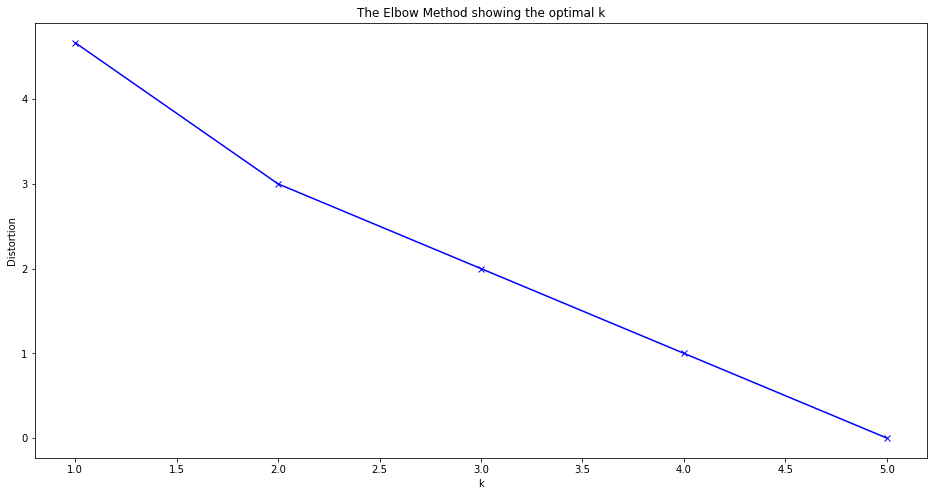

In [235]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_GrandAnse, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [236]:
kclusters = 2

GrandAnse_grouped_clustering = GrandAnse_onehot

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(GrandAnse_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 0, 0, 1, 1, 0])

In [237]:
nearby_venues_GrandAnse.insert(0, 'Cluster Labels', kmeans.labels_)
nearby_venues_GrandAnse.head()

,Cluster Labels,name,categories,lat,lng
0,0,Carrefour Bac Jeremie,Bus Station,18.634427,-74.110206
1,0,Parc Santa Helena,Soccer Field,18.638556,-74.114824
2,0,Jeremie Airport,Airport,18.662799,-74.170899
3,1,Romelo's Sur Cap Suddinner,Restaurant,18.652510,-74.123970
4,1,Le Dame-Marien Resto,Restaurant,18.560894,-74.421110


In [238]:
cluster_GrandAnse0=nearby_venues_GrandAnse[nearby_venues_GrandAnse['Cluster Labels']==0]
cluster_GrandAnse0.head()

,Cluster Labels,name,categories,lat,lng
0,0,Carrefour Bac Jeremie,Bus Station,18.634427,-74.110206
1,0,Parc Santa Helena,Soccer Field,18.638556,-74.114824
2,0,Jeremie Airport,Airport,18.662799,-74.170899
5,0,Parc Macaya,National Park,18.356481,-74.031029


In [239]:
cluster_GrandAnse0_plot=cluster_GrandAnse0.groupby('categories').count()
cluster_GrandAnse0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Airport,1,1,1,1
Bus Station,1,1,1,1
National Park,1,1,1,1
Soccer Field,1,1,1,1


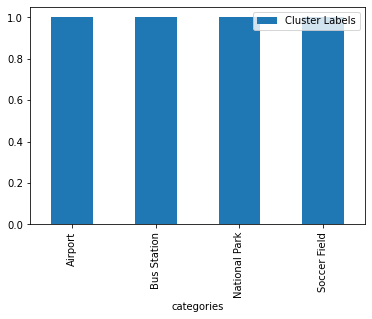

In [240]:
cluster_GrandAnse0_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [241]:
cluster_GrandAnse1=nearby_venues_GrandAnse[nearby_venues_GrandAnse['Cluster Labels']==1]
cluster_GrandAnse1.head()

,Cluster Labels,name,categories,lat,lng
3,1,Romelo's Sur Cap Suddinner,Restaurant,18.652510,-74.12397
4,1,Le Dame-Marien Resto,Restaurant,18.560894,-74.42111


In [242]:
cluster_GrandAnse1_plot=cluster_GrandAnse1.groupby('categories').count()
cluster_GrandAnse1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Restaurant,2,2,2,2


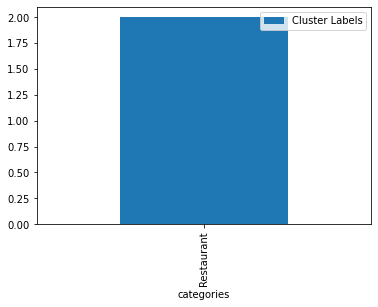

In [243]:
cluster_GrandAnse1_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [244]:
nearby_venues_GrandAnse2=nearby_venues_GrandAnse.copy()
nearby_venues_GrandAnse2['Cluster Labels']=nearby_venues_GrandAnse2['Cluster Labels'].replace(0,'Outdoors activity and Transportation')
nearby_venues_GrandAnse2['Cluster Labels']=nearby_venues_GrandAnse2['Cluster Labels'].replace(1,'Restaurants')
nearby_venues_GrandAnse2.head()

,Cluster Labels,name,categories,lat,lng
0,Outdoors activity and Transportation,Carrefour Bac Jeremie,Bus Station,18.634427,-74.110206
1,Outdoors activity and Transportation,Parc Santa Helena,Soccer Field,18.638556,-74.114824
2,Outdoors activity and Transportation,Jeremie Airport,Airport,18.662799,-74.170899
3,Restaurants,Romelo's Sur Cap Suddinner,Restaurant,18.652510,-74.123970
4,Restaurants,Le Dame-Marien Resto,Restaurant,18.560894,-74.421110


In [245]:
# create map
GrandAnse_map_clusters = folium.Map(location=[latitude_GrandAnse, longitude_GrandAnse], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##

for lat, lng, label, label2, activity in zip(df_GrandAnse['Latitude'], df_GrandAnse['Longitude'], df_GrandAnse['Name'], df_GrandAnse['Country Code'], df_GrandAnse['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(GrandAnse_map_clusters)  

GrandAnse_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_GrandAnse ['lat'], nearby_venues_GrandAnse['lng'], nearby_venues_GrandAnse['categories'], nearby_venues_GrandAnse['Cluster Labels'], nearby_venues_GrandAnse['name'], nearby_venues_GrandAnse2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(GrandAnse_map_clusters)       

GrandAnse_map_clusters

# Nippes Department

In [308]:
df_Nippes= df_HaitiLoc_copy[df_HaitiLoc_copy['Department']=='NIPPES'].reset_index(drop=True)
print(df_Nippes.shape)
df_Nippes.head()

(33, 9)


,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-21,SOGEBANK MIRAGOANE,MIRAGOANE,CARREFOUR DESRUISSEAUX,MIRAGOANE,NIPPES,0.000000,0.000000,0
1,HT1-60,SOGEXPRESS MIRAGOANE,ROUTE NATIONALE NUMERO 2,MIRAGOANE,MIRAGOANE,NIPPES,0.000000,0.000000,1
2,HT1-93,DEPOT ETERNEL GIN BON DOS,10 FOND DES NEGRES,,FONDS DES NEGRES,NIPPES,0.100000,0.000000,1
3,HT1-119,KING COMMUNICATION 1,ANGLE RUE DE LA PLACE GRAND RU,MIRAGOANE,MIRAGOANE,NIPPES,0.000000,0.000000,1
4,HT1-173,MACATY MULTI SERVICES,"MORISSEAU, LAZILE",,L ASILE,NIPPES,19.089189,-72.444879,1


In [309]:
latitude_Nippes = 18.445138
longitude_Nippes = -73.230150

In [310]:
map_Haiti_Nippes= folium.Map(location=[latitude_Nippes, longitude_Nippes], zoom_start=11)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Nippes['Latitude'], df_Nippes['Longitude'], df_Nippes['Name'], df_Nippes['Country Code'], df_Nippes['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Nippes)  
    
map_Haiti_Nippes

In [311]:
radius_Nippes = 20000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_Nippes, 
    longitude_Nippes, 
    radius_Nippes, 
    LIMIT)

In [312]:
Results_Nippes = requests.get(url_venues_Haiti).json()
Results_Nippes

{'meta': {'code': 200, 'requestId': '5fd6ce441d98ae664ed9b7a0'},
 'response': {'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 6,
  'suggestedBounds': {'ne': {'lat': 18.62513818000018,
    'lng': -73.04075618113666},
   'sw': {'lat': 18.26513781999982, 'lng': -73.41954381886333}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4e26aab0fa7682ed23032bf4',
       'name': 'Tiz Bar Resto',
       'location': {'address': 'Carrefour Desruisseaux (near "ti-gaby autoparts")',
        'lat': 18.4287086800253,
        'lng': -73.0799520857761,
        'labeledLatLngs': [{'label': 'display',
          'lat': 18.4287086800253,
          'lng': -73.0799520857761}],
        'distance': 15966,

In [313]:
Nippes_Venues = Results_Nippes ['response']['groups'][0]['items']
nearby_venues_Nippes = json_normalize(Nippes_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_Nippes = nearby_venues_Nippes.loc[:,filtered_columns]

nearby_venues_Nippes ['venue.categories'] = nearby_venues_Nippes.apply(get_category_type, axis=1)

nearby_venues_Nippes.columns = [col.split(".")[-1] for col in nearby_venues_Nippes.columns]

print(nearby_venues_Nippes.shape)

nearby_venues_Nippes.head()

(6, 4)


<ipython-input-313-99c2153ab047>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_Nippes = json_normalize(Nippes_Venues)


,name,categories,lat,lng
0,Tiz Bar Resto,Restaurant,18.428709,-73.079952
1,Morne Coma,Mountain,18.325745,-73.275410
2,Carrefour Des Ruisseaux,Pedestrian Plaza,18.431420,-73.079948
3,Tiz Market,Flea Market,18.428755,-73.080115
4,Chez Den Restaurant,Caribbean Restaurant,18.431273,-73.079752


In [314]:
nearby_venues_Nippes.groupby('categories').count()

,name,lat,lng
categories,,,
Caribbean Restaurant,1,1,1
Flea Market,1,1,1
Lake,1,1,1
Mountain,1,1,1
Pedestrian Plaza,1,1,1
Restaurant,1,1,1


In [315]:
nearby_venues_Nippes.groupby('categories').count().shape

(6, 3)

In [316]:
print('There are {} unique categories.'.format(len(nearby_venues_Nippes['categories'].unique())))

There are 6 unique categories.


In [317]:
map_Haiti_Nippes_venues = folium.Map(location=[latitude_Nippes, longitude_Nippes], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Nippes['Latitude'], df_Nippes['Longitude'], df_Nippes['Name'], df_Nippes['Country Code'], df_Nippes['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Nippes_venues)  

for lat, lng, label in zip(nearby_venues_Nippes['lat'], nearby_venues_Nippes['lng'], nearby_venues_Nippes['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_Nippes_venues)  

map_Haiti_Nippes_venues.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )
    
map_Haiti_Nippes_venues

In [318]:
Nippes_onehot = pd.get_dummies(nearby_venues_Nippes[['categories']], prefix="", prefix_sep="")
Nippes_onehot.head()

,Caribbean Restaurant,Flea Market,Lake,Mountain,Pedestrian Plaza,Restaurant
0,0,0,0,0,0,1
1,0,0,0,1,0,0
2,0,0,0,0,1,0
3,0,1,0,0,0,0
4,1,0,0,0,0,0


In [319]:
distortions_Nippes = []
K = range(1,6)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(Nippes_onehot)
    distortions_Nippes.append(kmeanModel.inertia_)

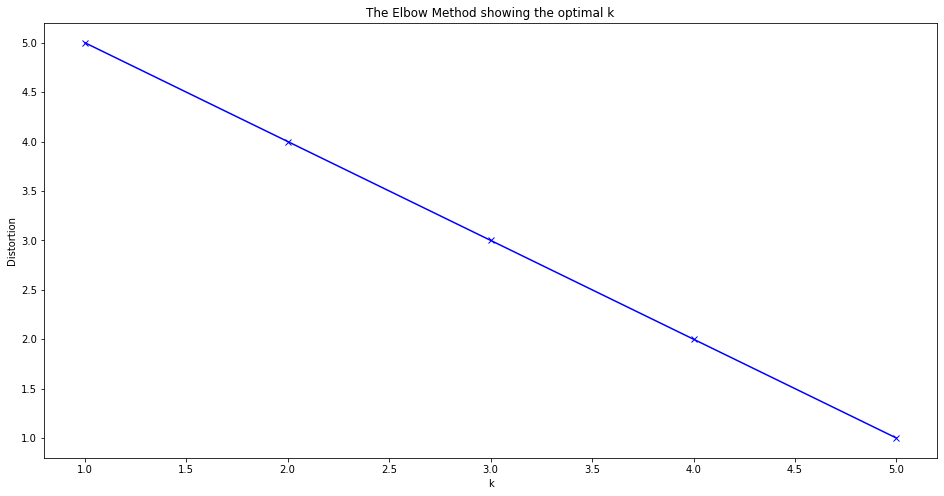

In [320]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_Nippes, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [321]:
kclusters = 2

Nippes_grouped_clustering = Nippes_onehot

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Nippes_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 1, 0, 0, 0, 0])

In [322]:
nearby_venues_Nippes.insert(0, 'Cluster Labels', kmeans.labels_)
nearby_venues_Nippes

,Cluster Labels,name,categories,lat,lng
0,0,Tiz Bar Resto,Restaurant,18.428709,-73.079952
1,1,Morne Coma,Mountain,18.325745,-73.275410
2,0,Carrefour Des Ruisseaux,Pedestrian Plaza,18.431420,-73.079948
3,0,Tiz Market,Flea Market,18.428755,-73.080115
4,0,Chez Den Restaurant,Caribbean Restaurant,18.431273,-73.079752
5,0,Etang De Miragoane,Lake,18.427593,-73.055928


In [323]:
cluster_Nippes0=nearby_venues_Nippes[nearby_venues_Nippes['Cluster Labels']==0]
cluster_Nippes0.head()

,Cluster Labels,name,categories,lat,lng
0,0,Tiz Bar Resto,Restaurant,18.428709,-73.079952
2,0,Carrefour Des Ruisseaux,Pedestrian Plaza,18.431420,-73.079948
3,0,Tiz Market,Flea Market,18.428755,-73.080115
4,0,Chez Den Restaurant,Caribbean Restaurant,18.431273,-73.079752
5,0,Etang De Miragoane,Lake,18.427593,-73.055928


In [324]:
cluster_Nippes0_plot=cluster_Nippes0.groupby('categories').count()
cluster_Nippes0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Caribbean Restaurant,1,1,1,1
Flea Market,1,1,1,1
Lake,1,1,1,1
Pedestrian Plaza,1,1,1,1
Restaurant,1,1,1,1


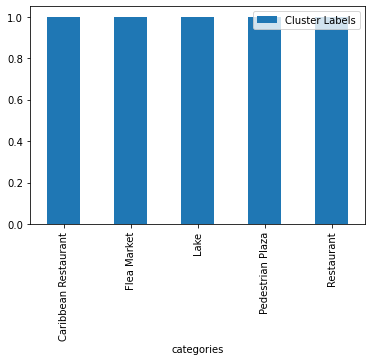

In [325]:
cluster_Nippes0_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [326]:
cluster_Nippes1=nearby_venues_Nippes[nearby_venues_Nippes['Cluster Labels']==1]
cluster_Nippes1.head()

,Cluster Labels,name,categories,lat,lng
1,1,Morne Coma,Mountain,18.325745,-73.27541


In [327]:
cluster_Nippes1_plot=cluster_Nippes1.groupby('categories').count()
cluster_Nippes1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Mountain,1,1,1,1


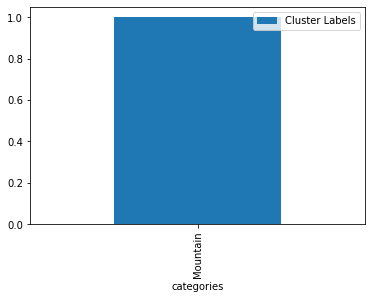

In [328]:
cluster_Nippes1_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [329]:
nearby_venues_Nippes2=nearby_venues_Nippes.copy()
nearby_venues_Nippes2['Cluster Labels']=nearby_venues_Nippes2['Cluster Labels'].replace(0,'Restaurants and Outdoors activity')
nearby_venues_Nippes2['Cluster Labels']=nearby_venues_Nippes2['Cluster Labels'].replace(1,'Outdoors activity')
nearby_venues_Nippes2.head()

,Cluster Labels,name,categories,lat,lng
0,Restaurants and Outdoors activity,Tiz Bar Resto,Restaurant,18.428709,-73.079952
1,Outdoors activity,Morne Coma,Mountain,18.325745,-73.275410
2,Restaurants and Outdoors activity,Carrefour Des Ruisseaux,Pedestrian Plaza,18.431420,-73.079948
3,Restaurants and Outdoors activity,Tiz Market,Flea Market,18.428755,-73.080115
4,Restaurants and Outdoors activity,Chez Den Restaurant,Caribbean Restaurant,18.431273,-73.079752


In [330]:
# create map
Nippes_map_clusters = folium.Map(location=[latitude_Nippes, longitude_Nippes], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##
    
for lat, lng, label, label2, activity in zip(df_Nippes['Latitude'], df_Nippes['Longitude'], df_Nippes['Name'], df_Nippes['Country Code'], df_Nippes['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(Nippes_map_clusters)  

Nippes_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_Nippes ['lat'], nearby_venues_Nippes['lng'], nearby_venues_Nippes['categories'], nearby_venues_Nippes['Cluster Labels'], nearby_venues_Nippes['name'], nearby_venues_Nippes2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(Nippes_map_clusters)       

Nippes_map_clusters

# Nord Department

In [331]:
df_Nord= df_HaitiLoc_copy[df_HaitiLoc_copy['Department']=='NORD'].reset_index(drop=True)
print(df_Nord.shape)
df_Nord.head()

(92, 9)


,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-15,SOGEBANK CAP 1,RUE 11 A,,CAP HAITIEN,NORD,-19.757953,-72.200228,1
1,HT1-28,SOGEXPRESS CAP 1,RUE 11A,,CAP HAITIEN,NORD,0.000000,0.000000,1
2,HT1-32,SOGEBANK ST MICHEL,CAP HAITIEN,,CAP HAITIEN,NORD,0.000000,0.000000,1
3,HT1-44,CABINE SOGEXPRESS VERTIERES,VERTIERES,,CAP HAITIEN,NORD,0.000000,0.000000,1
4,HT1-45,MB PHARMA,"#58,RUE ESPAGNOLE",,CAP HAITIEN,NORD,19.759732,-72.203632,1


In [332]:
latitude_Nord = 19.639078
longitude_Nord = -72.289784

In [333]:
map_Haiti_Nord= folium.Map(location=[latitude_Nord, longitude_Nord], zoom_start=11)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Nord['Latitude'], df_Nord['Longitude'], df_Nord['Name'], df_Nord['Country Code'], df_Nord['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Nord)  
    
map_Haiti_Nord

In [334]:
radius_Nord = 30000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_Nord, 
    longitude_Nord, 
    radius_Nord, 
    LIMIT)

In [335]:
Results_Nord = requests.get(url_venues_Haiti).json()
Results_Nord

{'meta': {'code': 200, 'requestId': '5fd6cf0eb12ad90b4492d25c'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 20,
  'suggestedBounds': {'ne': {'lat': 19.909078270000272,
    'lng': -72.00364255802016},
   'sw': {'lat': 19.36907772999973, 'lng': -72.57592544197983}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4e6bdb40b61c739ba84cd7e9',
       'name': 'Citadelle La Ferrière',
       'location': {'address': 'Milot',
        'lat': 19.57349831129896,
        'lng': -72.24386215209961,
        'labeledLatLngs': [{'label': 'display',
          'lat': 19.57349

In [336]:
Nord_Venues = Results_Nord ['response']['groups'][0]['items']
nearby_venues_Nord = json_normalize(Nord_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_Nord = nearby_venues_Nord.loc[:,filtered_columns]

nearby_venues_Nord ['venue.categories'] = nearby_venues_Nord.apply(get_category_type, axis=1)

nearby_venues_Nord.columns = [col.split(".")[-1] for col in nearby_venues_Nord.columns]

print(nearby_venues_Nord.shape)

nearby_venues_Nord.head()

(20, 4)


<ipython-input-336-170547fcbde6>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_Nord = json_normalize(Nord_Venues)


,name,categories,lat,lng
0,Citadelle La Ferrière,Historic Site,19.573498,-72.243862
1,La Kay Restaurant,Caribbean Restaurant,19.767594,-72.194401
2,Adrenaline Beach,Beach,19.786472,-72.242096
3,Dragon's Breath Flight Line,Rock Climbing Spot,19.787099,-72.246543
4,Allure Of The Seas,Boat or Ferry,19.784029,-72.249821


In [337]:
nearby_venues_Nord.groupby('categories').count()

,name,lat,lng
categories,,,
Airport,1,1,1
Beach,3,3,3
Boat or Ferry,2,2,2
Campground,1,1,1
Caribbean Restaurant,1,1,1
Cruise Ship,1,1,1
Fast Food Restaurant,1,1,1
Historic Site,1,1,1
Hotel,3,3,3


In [338]:
nearby_venues_Nord.groupby('categories').count().shape

(14, 3)

In [339]:
print('There are {} unique categories.'.format(len(nearby_venues_Nord['categories'].unique())))

There are 14 unique categories.


In [340]:
map_Haiti_Nord_venues = folium.Map(location=[latitude_Nord, longitude_Nord], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Nord['Latitude'], df_Nord['Longitude'], df_Nord['Name'], df_Nord['Country Code'], df_Nord['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Nord_venues)  

for lat, lng, label in zip(nearby_venues_Nord['lat'], nearby_venues_Nord['lng'], nearby_venues_Nord['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_Nord_venues)  

map_Haiti_Nord_venues.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

map_Haiti_Nord_venues

In [341]:
Nord_onehot = pd.get_dummies(nearby_venues_Nord[['categories']], prefix="", prefix_sep="")
Nord_onehot.head()

,Airport,Beach,Boat or Ferry,Campground,Caribbean Restaurant,Cruise Ship,Fast Food Restaurant,Historic Site,Hotel,Park,Resort,Restaurant,Rock Climbing Spot,Tiki Bar
0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [342]:
distortions_Nord = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(Nord_onehot)
    distortions_Nord.append(kmeanModel.inertia_)

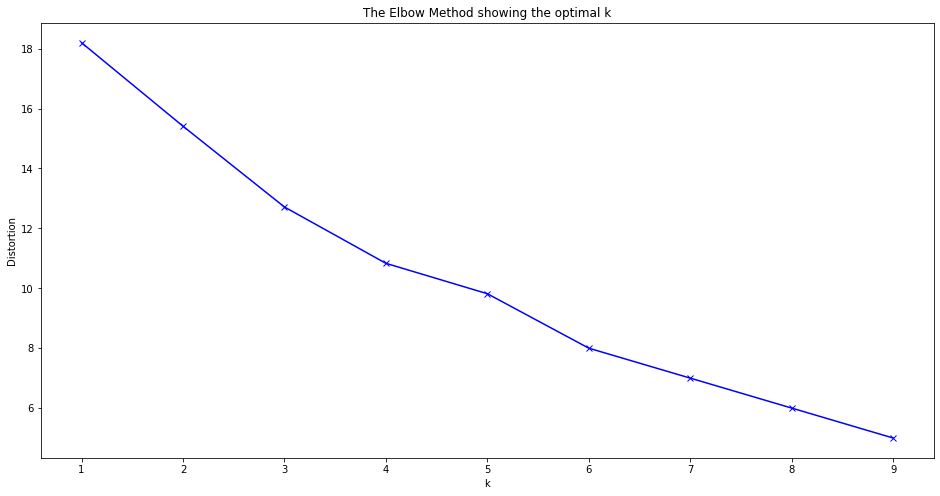

In [343]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_Nord, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [344]:
kclusters = 4

Nord_grouped_clustering = Nord_onehot

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Nord_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 0, 1, 0, 2, 0, 1, 1, 0, 3])

In [345]:
nearby_venues_Nord.insert(0, 'Cluster Labels', kmeans.labels_)
nearby_venues_Nord.head()

,Cluster Labels,name,categories,lat,lng
0,0,Citadelle La Ferrière,Historic Site,19.573498,-72.243862
1,0,La Kay Restaurant,Caribbean Restaurant,19.767594,-72.194401
2,1,Adrenaline Beach,Beach,19.786472,-72.242096
3,0,Dragon's Breath Flight Line,Rock Climbing Spot,19.787099,-72.246543
4,2,Allure Of The Seas,Boat or Ferry,19.784029,-72.249821


In [346]:
cluster_Nord0=nearby_venues_Nord[nearby_venues_Nord['Cluster Labels']==0]
cluster_Nord0.head()

,Cluster Labels,name,categories,lat,lng
0,0,Citadelle La Ferrière,Historic Site,19.573498,-72.243862
1,0,La Kay Restaurant,Caribbean Restaurant,19.767594,-72.194401
3,0,Dragon's Breath Flight Line,Rock Climbing Spot,19.787099,-72.246543
5,0,Labadee,Resort,19.786188,-72.244062
8,0,Kokiyaj,Restaurant,19.764264,-72.195678


In [347]:
cluster_Nord0_plot=cluster_Nord0.groupby('categories').count()
cluster_Nord0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Airport,1,1,1,1
Campground,1,1,1,1
Caribbean Restaurant,1,1,1,1
Cruise Ship,1,1,1,1
Fast Food Restaurant,1,1,1,1


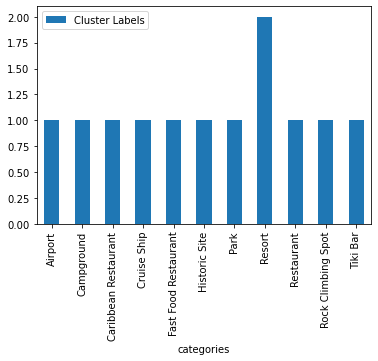

In [348]:
cluster_Nord0_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [349]:
cluster_Nord1=nearby_venues_Nord[nearby_venues_Nord['Cluster Labels']==1]
cluster_Nord1.head()

,Cluster Labels,name,categories,lat,lng
2,1,Adrenaline Beach,Beach,19.786472,-72.242096
6,1,Barefoot Beach Club,Beach,19.783237,-72.250301
7,1,Columbus Cove,Beach,19.785367,-72.242419


In [350]:
cluster_Nord1_plot=cluster_Nord1.groupby('categories').count()
cluster_Nord1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Beach,3,3,3,3


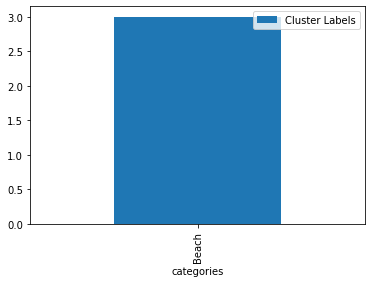

In [351]:
cluster_Nord1_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [352]:
cluster_Nord2=nearby_venues_Nord[nearby_venues_Nord['Cluster Labels']==2]
cluster_Nord2.head()

,Cluster Labels,name,categories,lat,lng
4,2,Allure Of The Seas,Boat or Ferry,19.784029,-72.249821
18,2,Sail Away,Boat or Ferry,19.854829,-72.319074


In [353]:
cluster_Nord2_plot=cluster_Nord2.groupby('categories').count()
cluster_Nord2_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Boat or Ferry,2,2,2,2


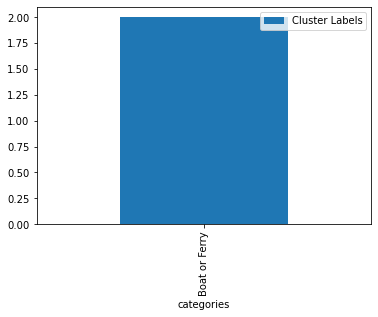

In [354]:
cluster_Nord2_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [355]:
cluster_Nord3=nearby_venues_Nord[nearby_venues_Nord['Cluster Labels']==3]
cluster_Nord3.head()

,Cluster Labels,name,categories,lat,lng
9,3,Auberge du Picolet,Hotel,19.768338,-72.194150
10,3,Hostellerie du Roi Christophe,Hotel,19.763359,-72.197729
11,3,Habitation Jouissant,Hotel,19.768233,-72.195978


In [356]:
cluster_Nord3_plot=cluster_Nord3.groupby('categories').count()
cluster_Nord3_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Hotel,3,3,3,3


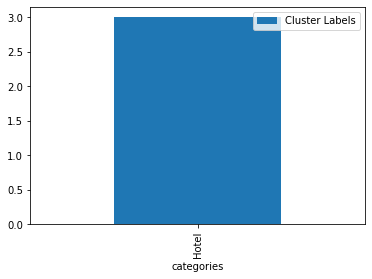

In [357]:
cluster_Nord3_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [358]:
nearby_venues_Nord2=nearby_venues_Nord.copy()
nearby_venues_Nord2['Cluster Labels']=nearby_venues_Nord2['Cluster Labels'].replace(0,'Resorts and Tourism')
nearby_venues_Nord2['Cluster Labels']=nearby_venues_Nord2['Cluster Labels'].replace(1,'Beach')
nearby_venues_Nord2['Cluster Labels']=nearby_venues_Nord2['Cluster Labels'].replace(2,'Water Activity')
nearby_venues_Nord2['Cluster Labels']=nearby_venues_Nord2['Cluster Labels'].replace(3,'Hotels')
nearby_venues_Nord2.head()

,Cluster Labels,name,categories,lat,lng
0,Resorts and Tourism,Citadelle La Ferrière,Historic Site,19.573498,-72.243862
1,Resorts and Tourism,La Kay Restaurant,Caribbean Restaurant,19.767594,-72.194401
2,Beach,Adrenaline Beach,Beach,19.786472,-72.242096
3,Resorts and Tourism,Dragon's Breath Flight Line,Rock Climbing Spot,19.787099,-72.246543
4,Water Activity,Allure Of The Seas,Boat or Ferry,19.784029,-72.249821


In [359]:
# create map
Nord_map_clusters = folium.Map(location=[latitude_Nord, longitude_Nord], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##
    
for lat, lng, label, label2, activity in zip(df_Nord['Latitude'], df_Nord['Longitude'], df_Nord['Name'], df_Nord['Country Code'], df_Nord['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(Nord_map_clusters)  

Nord_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_Nord ['lat'], nearby_venues_Nord['lng'], nearby_venues_Nord['categories'], nearby_venues_Nord['Cluster Labels'], nearby_venues_Nord['name'], nearby_venues_Nord2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(Nord_map_clusters)       

Nord_map_clusters

# Nord-Est Department

In [360]:
df_NordEst= df_HaitiLoc_copy[df_HaitiLoc_copy['Department']=='NORD-EST'].reset_index(drop=True)
print(df_NordEst.shape)
df_NordEst.head()

(20, 9)


,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-95,SOGEBANK OUANAMINTHE,ANGLE RUES ESPAGNOLE & NOTRE D,,OUANAMINTHE,NORD-EST,19.550231,-71.723933,0
1,HT1-291,CAISSE POPULAIRE LE DAUPHIN CP,"11, RUE CLUGNY,FORT-LIBERTE",,FORT LIBERTE,NORD-EST,19.646171,-71.834341,1
2,HT1-309,KPTAT PERCHES,EN FACE DE LA PLACE PUBLIQUE,,PERCHES,NORD-EST,19.522474,-71.924214,1
3,HT1-310,KPSEK MONT ORGANISE,MONT-ORGANISE,,MONT ORGANISE,NORD-EST,19.405893,-71.783189,1
4,HT1-318,HU ENTREPRISE,RUE ST CHARLES,"87, RUE ST CHARLES",TROU DU NORD,NORD-EST,19.617331,-72.022179,1


In [421]:
latitude_NordEst = 19.658426
longitude_NordEst = -71.867350

In [362]:
map_Haiti_NordEst = folium.Map(location=[latitude_NordEst, longitude_NordEst], zoom_start=11)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_NordEst['Latitude'], df_NordEst['Longitude'], df_NordEst['Name'], df_NordEst['Country Code'], df_NordEst['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_NordEst)  
    
map_Haiti_NordEst

In [434]:
radius_NordEst = 10000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_NordEst, 
    longitude_NordEst, 
    radius_NordEst, 
    LIMIT)

In [435]:
Results_NordEst = requests.get(url_venues_Haiti).json()
Results_NordEst

{'meta': {'code': 200, 'requestId': '5fd6d3cc0223702a3a7529a0'},
 'response': {'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."},
  'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 3,
  'suggestedBounds': {'ne': {'lat': 19.748426090000088,
    'lng': -71.77195801876077},
   'sw': {'lat': 19.56842590999991, 'lng': -71.96274198123923}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4de59079fa764cf4becc0ea8',
       'name': 'Fort Liberté, Haiti',
       'location': {'lat': 19.664927321726005,
        'lng': -71.83724516262686,
        'labeledLatLngs': [{'label': 'display',
          'lat': 19.

In [436]:
NordEst_Venues = Results_NordEst ['response']['groups'][0]['items']
nearby_venues_NordEst = json_normalize(NordEst_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_NordEst = nearby_venues_NordEst.loc[:,filtered_columns]

nearby_venues_NordEst ['venue.categories'] = nearby_venues_NordEst.apply(get_category_type, axis=1)

nearby_venues_NordEst.columns = [col.split(".")[-1] for col in nearby_venues_NordEst.columns]

print(nearby_venues_NordEst.shape)

nearby_venues_NordEst.head()

(3, 4)


<ipython-input-436-26c5684b26c7>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_NordEst = json_normalize(NordEst_Venues)


,name,categories,lat,lng
0,"Fort Liberté, Haiti",Scenic Lookout,19.664927,-71.837245
1,Morne Casse,Mountain,19.604307,-71.807365
2,faeton Beach,Beach,19.636711,-71.953575


In [437]:
nearby_venues_NordEst.groupby('categories').count()

,name,lat,lng
categories,,,
Beach,1,1,1
Mountain,1,1,1
Scenic Lookout,1,1,1


In [438]:
nearby_venues_NordEst.groupby('categories').count().shape

(3, 3)

In [439]:
print('There are {} unique categories.'.format(len(nearby_venues_NordEst['categories'].unique())))

There are 3 unique categories.


In [440]:
map_Haiti_NordEst_venues = folium.Map(location=[latitude_NordEst, longitude_NordEst], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_NordEst['Latitude'], df_NordEst['Longitude'], df_NordEst['Name'], df_NordEst['Country Code'], df_NordEst['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_NordEst_venues)  

for lat, lng, label in zip(nearby_venues_NordEst['lat'], nearby_venues_NordEst['lng'], nearby_venues_NordEst['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_NordEst_venues)  

map_Haiti_NordEst_venues.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )
    
map_Haiti_NordEst_venues

In [441]:
NordEst_onehot = pd.get_dummies(nearby_venues_NordEst[['categories']], prefix="", prefix_sep="")
NordEst_onehot.head()

,Beach,Mountain,Scenic Lookout
0,0,0,1
1,0,1,0
2,1,0,0


In [443]:
distortions_NordEst = []
K = range(1,3)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(NordEst_onehot)
    distortions_NordEst.append(kmeanModel.inertia_)

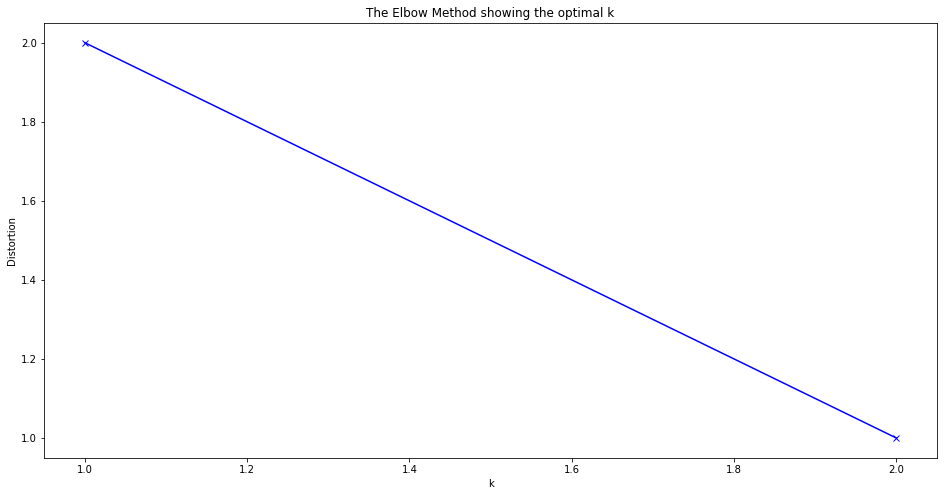

In [444]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_NordEst, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [445]:
kclusters = 2

NordEst_grouped_clustering = NordEst_onehot

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(NordEst_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 1, 0])

In [446]:
nearby_venues_NordEst.insert(0, 'Cluster Labels', kmeans.labels_)
nearby_venues_NordEst.head()

,Cluster Labels,name,categories,lat,lng
0,0,"Fort Liberté, Haiti",Scenic Lookout,19.664927,-71.837245
1,1,Morne Casse,Mountain,19.604307,-71.807365
2,0,faeton Beach,Beach,19.636711,-71.953575


In [447]:
cluster_NordEst0=nearby_venues_NordEst[nearby_venues_NordEst['Cluster Labels']==0]
cluster_NordEst0.head()

,Cluster Labels,name,categories,lat,lng
0,0,"Fort Liberté, Haiti",Scenic Lookout,19.664927,-71.837245
2,0,faeton Beach,Beach,19.636711,-71.953575


In [448]:
cluster_NordEst0_plot=cluster_NordEst0.groupby('categories').count()
cluster_NordEst0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Beach,1,1,1,1
Scenic Lookout,1,1,1,1


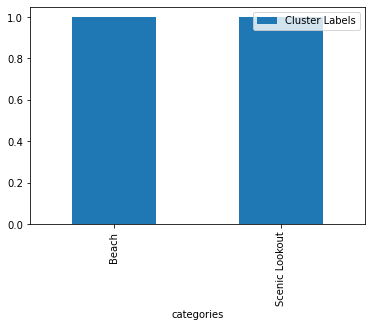

In [449]:
cluster_NordEst0_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [450]:
cluster_NordEst1=nearby_venues_NordEst[nearby_venues_NordEst['Cluster Labels']==1]
cluster_NordEst1.head()

,Cluster Labels,name,categories,lat,lng
1,1,Morne Casse,Mountain,19.604307,-71.807365


In [451]:
cluster_NordEst1_plot=cluster_NordEst1.groupby('categories').count()
cluster_NordEst1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Mountain,1,1,1,1


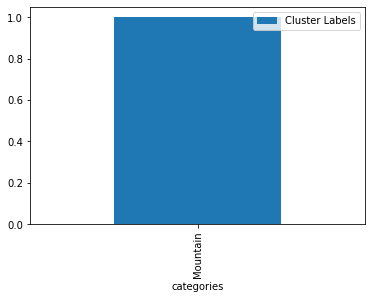

In [452]:
cluster_NordEst1_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [453]:
nearby_venues_NordEst2=nearby_venues_NordEst.copy()
nearby_venues_NordEst2['Cluster Labels']=nearby_venues_NordEst2['Cluster Labels'].replace(0,'Beach and Tourism')
nearby_venues_NordEst2['Cluster Labels']=nearby_venues_NordEst2['Cluster Labels'].replace(1,'Outdoors activity')
nearby_venues_NordEst2.head()

,Cluster Labels,name,categories,lat,lng
0,Beach and Tourism,"Fort Liberté, Haiti",Scenic Lookout,19.664927,-71.837245
1,Outdoors activity,Morne Casse,Mountain,19.604307,-71.807365
2,Beach and Tourism,faeton Beach,Beach,19.636711,-71.953575


In [454]:
# create map
NordEst_map_clusters = folium.Map(location=[latitude_NordEst, longitude_NordEst], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##
    
for lat, lng, label, label2, activity in zip(df_NordEst['Latitude'], df_NordEst['Longitude'], df_NordEst['Name'], df_NordEst['Country Code'], df_NordEst['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(NordEst_map_clusters)  

NordEst_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_NordEst ['lat'], nearby_venues_NordEst['lng'], nearby_venues_NordEst['categories'], nearby_venues_NordEst['Cluster Labels'], nearby_venues_NordEst['name'], nearby_venues_NordEst2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(NordEst_map_clusters)       

NordEst_map_clusters

# Nord-Ouest Department

In [455]:
df_NordOuest= df_HaitiLoc_copy[df_HaitiLoc_copy['Department']=='NORD-OUEST'].reset_index(drop=True)
print(df_NordOuest.shape)
df_NordOuest.head()

(26, 9)


,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-31,SOGEXPRESS PORT DE PAIX 1,RUE STENIO VINCENT,,PORT DE PAIX,NORD-OUEST,0.000000,0.000000,1
1,HT1-87,INFOTEL MULTISERVICES,MARE ROUGE MOLE ST NICOLAS,15 RUE LA PAIX,PORT DE PAIX,NORD-OUEST,1.000000,0.000000,1
2,HT1-88,SOGEXPRESS PORT DE PAIX 2,"2, RUE DESSALINES",A COTE DU BUREAU POSTAL,PORT DE PAIX,NORD-OUEST,19.939239,-72.830195,1
3,HT1-136,DGS PORT AU PAIX,"PORT-DE-PAIX 72, rue Sténio Vincent.",,PORT DE PAIX,NORD-OUEST,0.000000,0.000000,1
4,HT1-162,DGS SAINT LOUIS DU NORD,SAINT LOUIS DU NORD,,SAINT LOUIS DU NORD,NORD-OUEST,0.000000,0.000000,1


In [507]:
latitude_NordOuest = 19.910289
longitude_NordOuest = -72.899088

In [457]:
map_Haiti_NordOuest= folium.Map(location=[latitude_NordOuest, longitude_NordOuest], zoom_start=11)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_NordOuest['Latitude'], df_NordOuest['Longitude'], df_NordOuest['Name'], df_NordOuest['Country Code'], df_NordOuest['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_NordOuest)  
    
map_Haiti_NordOuest

In [515]:
radius_NordOuest = 20000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_NordOuest, 
    longitude_NordOuest, 
    radius_NordOuest, 
    LIMIT)

In [548]:
Results_NordOuest = requests.get(url_venues_Haiti).json()
Results_NordOuest

{'meta': {'code': 200, 'requestId': '5fd6e15c9e3c0852770a814e'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 6,
  'suggestedBounds': {'ne': {'lat': 18.574708270000272,
    'lng': -73.5018424663576},
   'sw': {'lat': 18.03470772999973, 'lng': -74.0695615336424}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4e9f83e60039b2cba45c4c20',
       'name': 'Abaka Bay',
       'location': {'address': 'ile a vache',
        'lat': 18.09416693245215,
        'lng': -73.70202630758286,
        'labeledLatLngs': [{'label': 'display',
          'lat': 18.09416693245215

In [549]:
NordOuest_Venues = Results_NordOuest ['response']['groups'][0]['items']
nearby_venues_NordOuest = json_normalize(NordOuest_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_NordOuest = nearby_venues_NordOuest.loc[:,filtered_columns]

nearby_venues_NordOuest ['venue.categories'] = nearby_venues_NordOuest.apply(get_category_type, axis=1)

nearby_venues_NordOuest.columns = [col.split(".")[-1] for col in nearby_venues_NordOuest.columns]

print(nearby_venues_NordOuest.shape)

nearby_venues_NordOuest.head()

(6, 4)


<ipython-input-549-5cbc6f79f70f>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_NordOuest = json_normalize(NordOuest_Venues)


,name,categories,lat,lng
0,Abaka Bay,Resort,18.094167,-73.702026
1,Gelée Beach,Beach,18.181293,-73.767581
2,Hot Spot,Fast Food Restaurant,18.204678,-73.756530
3,Pointe Sable Beach,Beach,18.099404,-73.939159
4,Pen Dore,Burger Joint,18.192869,-73.748329


In [518]:
nearby_venues_NordOuest.groupby('categories').count()

,name,lat,lng
categories,,,
Hotel Bar,1,1,1
Mountain,1,1,1
Restaurant,1,1,1
Snack Place,1,1,1


In [519]:
nearby_venues_NordOuest.groupby('categories').count().shape

(4, 3)

In [520]:
print('There are {} unique categories.'.format(len(nearby_venues_NordOuest['categories'].unique())))

There are 4 unique categories.


In [521]:
map_Haiti_NordOuest_venues = folium.Map(location=[latitude_NordOuest, longitude_NordOuest], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_NordOuest['Latitude'], df_NordOuest['Longitude'], df_NordOuest['Name'], df_NordOuest['Country Code'], df_NordOuest['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_NordOuest_venues)  

for lat, lng, label in zip(nearby_venues_NordOuest['lat'], nearby_venues_NordOuest['lng'], nearby_venues_NordOuest['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_NordOuest_venues)  

map_Haiti_NordOuest_venues.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )
    
map_Haiti_NordOuest_venues

In [522]:
NordOuest_onehot = pd.get_dummies(nearby_venues_NordOuest[['categories']], prefix="", prefix_sep="")
NordOuest_onehot.head()

,Hotel Bar,Mountain,Restaurant,Snack Place
0,1,0,0,0
1,0,0,0,1
2,0,0,1,0
3,0,1,0,0


In [524]:
distortions_NordOuest = []
K = range(1,4)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(NordOuest_onehot)
    distortions_NordOuest.append(kmeanModel.inertia_)

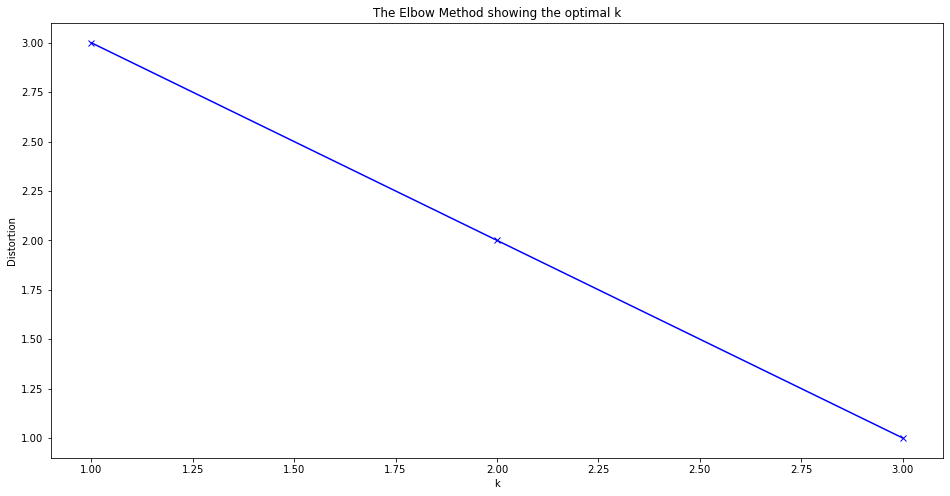

In [525]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_NordOuest, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [526]:
kclusters = 2

NordOuest_grouped_clustering = NordOuest_onehot

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(NordOuest_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 0, 1, 0])

In [527]:
nearby_venues_NordOuest.insert(0, 'Cluster Labels', kmeans.labels_)
nearby_venues_NordOuest.head()

,Cluster Labels,name,categories,lat,lng
0,0,RENDEZ-VOUS Club Hotel,Hotel Bar,19.945531,-72.826646
1,0,Seven Eleven [Centre Ville],Snack Place,19.938031,-72.829735
2,1,Solarium Bistro,Restaurant,19.990118,-72.959310
3,0,Lanou,Mountain,19.765045,-72.910970


In [528]:
cluster_NordOuest0=nearby_venues_NordOuest[nearby_venues_NordOuest['Cluster Labels']==0]
cluster_NordOuest0.head()

,Cluster Labels,name,categories,lat,lng
0,0,RENDEZ-VOUS Club Hotel,Hotel Bar,19.945531,-72.826646
1,0,Seven Eleven [Centre Ville],Snack Place,19.938031,-72.829735
3,0,Lanou,Mountain,19.765045,-72.910970


In [529]:
cluster_NordOuest0_plot=cluster_NordOuest0.groupby('categories').count()
cluster_NordOuest0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Hotel Bar,1,1,1,1
Mountain,1,1,1,1
Snack Place,1,1,1,1


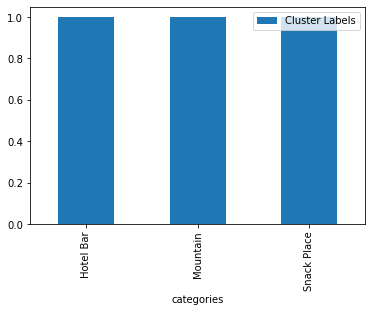

In [530]:
cluster_NordOuest0_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [531]:
cluster_NordOuest1=nearby_venues_NordOuest[nearby_venues_NordOuest['Cluster Labels']==1]
cluster_NordOuest1.head()

,Cluster Labels,name,categories,lat,lng
2,1,Solarium Bistro,Restaurant,19.990118,-72.95931


In [532]:
cluster_NordOuest1_plot=cluster_NordOuest1.groupby('categories').count()
cluster_NordOuest1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Restaurant,1,1,1,1


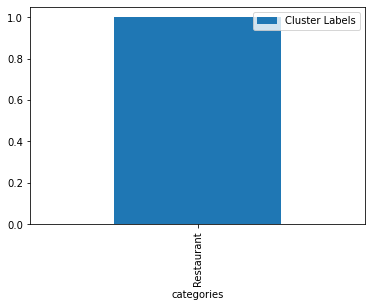

In [533]:
cluster_NordOuest1_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [534]:
nearby_venues_NordOuest2=nearby_venues_NordOuest.copy()
nearby_venues_NordOuest2['Cluster Labels']=nearby_venues_NordOuest2['Cluster Labels'].replace(0,'Bar and Snacks')
nearby_venues_NordOuest2['Cluster Labels']=nearby_venues_NordOuest2['Cluster Labels'].replace(1,'Restaurants')
nearby_venues_NordOuest2.head()

,Cluster Labels,name,categories,lat,lng
0,Bar and Snacks,RENDEZ-VOUS Club Hotel,Hotel Bar,19.945531,-72.826646
1,Bar and Snacks,Seven Eleven [Centre Ville],Snack Place,19.938031,-72.829735
2,Restaurants,Solarium Bistro,Restaurant,19.990118,-72.959310
3,Bar and Snacks,Lanou,Mountain,19.765045,-72.910970


In [535]:
# create map
NordOuest_map_clusters = folium.Map(location=[latitude_NordOuest, longitude_NordOuest], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##
    
for lat, lng, label, label2, activity in zip(df_NordOuest['Latitude'], df_NordOuest['Longitude'], df_NordOuest['Name'], df_NordOuest['Country Code'], df_NordOuest['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(NordOuest_map_clusters)  

NordOuest_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_NordOuest ['lat'], nearby_venues_NordOuest['lng'], nearby_venues_NordOuest['categories'], nearby_venues_NordOuest['Cluster Labels'], nearby_venues_NordOuest['name'], nearby_venues_NordOuest2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(NordOuest_map_clusters)       

NordOuest_map_clusters

# Sud Department

In [536]:
df_Sud= df_HaitiLoc_copy[df_HaitiLoc_copy['Department']=='SUD'].reset_index(drop=True)
print(df_Sud.shape)
df_Sud.head()

(54, 9)


,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-19,SOGEBANK CAYES,"105, RUE STENIO VINCENT",PRES DE LA MAIRIE,LES CAYES,SUD,18.194956,-73.748136,1
1,HT1-43,SOGEXPRESS CAYES 1,"105, RUE STENIO VINCENT",,LES CAYES,SUD,18.194956,-73.748136,1
2,HT1-63,CARAIBES INTER MULTI SERVICES,RUE DR HYPPOLITE # 39,ROUTE NATIONALE 2,GRAND ANSE,SUD,18.640344,-74.117531,1
3,HT1-64,THE FELIX BUSINESS1 VIEUX BOUR,88 RUE L AZELE,,AQUIN,SUD,18.282674,-73.392129,1
4,HT1-81,AGENCE DEUX MAPOUS,65. AVENUE CARTAGENA,ROUTE DEUX MAPOUS,LES CAYES,SUD,18.194523,-73.742642,1


In [537]:
latitude_Sud = 18.304708
longitude_Sud = -73.785702

In [540]:
map_Haiti_Sud= folium.Map(location=[latitude_Sud, longitude_Sud], zoom_start=11)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Sud['Latitude'], df_Sud['Longitude'], df_Sud['Name'], df_Sud['Country Code'], df_Sud['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Sud)  
    
map_Haiti_Sud

In [545]:
radius_Sud = 30000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_Sud, 
    longitude_Sud, 
    radius_Sud, 
    LIMIT)

In [546]:
Results_Sud = requests.get(url_venues_Haiti).json()
Results_Sud

{'meta': {'code': 200, 'requestId': '5fd6e121e3f54d324489d90c'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 6,
  'suggestedBounds': {'ne': {'lat': 18.574708270000272,
    'lng': -73.5018424663576},
   'sw': {'lat': 18.03470772999973, 'lng': -74.0695615336424}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4e9f83e60039b2cba45c4c20',
       'name': 'Abaka Bay',
       'location': {'address': 'ile a vache',
        'lat': 18.09416693245215,
        'lng': -73.70202630758286,
        'labeledLatLngs': [{'label': 'display',
          'lat': 18.09416693245215

In [550]:
Sud_Venues = Results_Sud ['response']['groups'][0]['items']
nearby_venues_Sud = json_normalize(Sud_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_Sud = nearby_venues_Sud.loc[:,filtered_columns]

nearby_venues_Sud ['venue.categories'] = nearby_venues_Sud.apply(get_category_type, axis=1)

nearby_venues_Sud.columns = [col.split(".")[-1] for col in nearby_venues_Sud.columns]

print(nearby_venues_Sud.shape)

nearby_venues_Sud.head()

(6, 4)


<ipython-input-550-d5f0154e0ce2>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_Sud = json_normalize(Sud_Venues)


,name,categories,lat,lng
0,Abaka Bay,Resort,18.094167,-73.702026
1,Gelée Beach,Beach,18.181293,-73.767581
2,Hot Spot,Fast Food Restaurant,18.204678,-73.756530
3,Pointe Sable Beach,Beach,18.099404,-73.939159
4,Pen Dore,Burger Joint,18.192869,-73.748329


In [551]:
nearby_venues_Sud.groupby('categories').count()

,name,lat,lng
categories,,,
Beach,2,2,2
Burger Joint,1,1,1
Fast Food Restaurant,1,1,1
Hotel Pool,1,1,1
Resort,1,1,1


In [552]:
nearby_venues_Sud.groupby('categories').count().shape

(5, 3)

In [553]:
print('There are {} unique categories.'.format(len(nearby_venues_Sud['categories'].unique())))

There are 5 unique categories.


In [554]:
map_Haiti_Sud_venues = folium.Map(location=[latitude_Sud, longitude_Sud], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_Sud['Latitude'], df_Sud['Longitude'], df_Sud['Name'], df_Sud['Country Code'], df_Sud['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_Sud_venues)  

for lat, lng, label in zip(nearby_venues_Sud['lat'], nearby_venues_Sud['lng'], nearby_venues_Sud['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_Sud_venues)  

map_Haiti_Sud_venues.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )
    
map_Haiti_Sud_venues

In [555]:
Sud_onehot = pd.get_dummies(nearby_venues_Sud[['categories']], prefix="", prefix_sep="")
Sud_onehot.head()

,Beach,Burger Joint,Fast Food Restaurant,Hotel Pool,Resort
0,0,0,0,0,1
1,1,0,0,0,0
2,0,0,1,0,0
3,1,0,0,0,0
4,0,1,0,0,0


In [557]:
distortions_Sud = []
K = range(1,6)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(Sud_onehot)
    distortions_Sud.append(kmeanModel.inertia_)

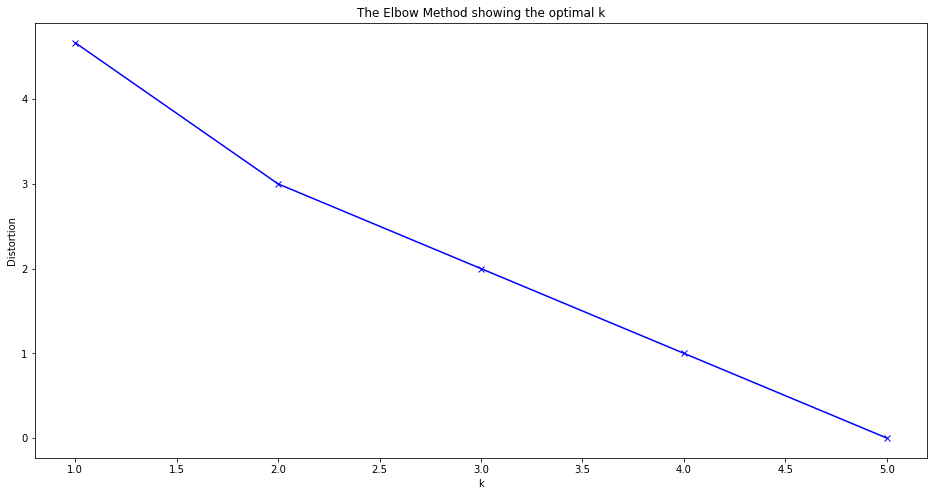

In [558]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_Sud, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [559]:
kclusters = 2

Sud_grouped_clustering = Sud_onehot

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Sud_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 1, 0, 1, 0, 0])

In [560]:
nearby_venues_Sud.insert(0, 'Cluster Labels', kmeans.labels_)
nearby_venues_Sud.head()

,Cluster Labels,name,categories,lat,lng
0,0,Abaka Bay,Resort,18.094167,-73.702026
1,1,Gelée Beach,Beach,18.181293,-73.767581
2,0,Hot Spot,Fast Food Restaurant,18.204678,-73.756530
3,1,Pointe Sable Beach,Beach,18.099404,-73.939159
4,0,Pen Dore,Burger Joint,18.192869,-73.748329


In [561]:
cluster_Sud0=nearby_venues_Sud[nearby_venues_Sud['Cluster Labels']==0]
cluster_Sud0.head()

,Cluster Labels,name,categories,lat,lng
0,0,Abaka Bay,Resort,18.094167,-73.702026
2,0,Hot Spot,Fast Food Restaurant,18.204678,-73.756530
4,0,Pen Dore,Burger Joint,18.192869,-73.748329
5,0,Hotel Le Manguier,Hotel Pool,18.212898,-73.762107


In [562]:
cluster_Sud0_plot=cluster_Sud0.groupby('categories').count()
cluster_Sud0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Burger Joint,1,1,1,1
Fast Food Restaurant,1,1,1,1
Hotel Pool,1,1,1,1
Resort,1,1,1,1


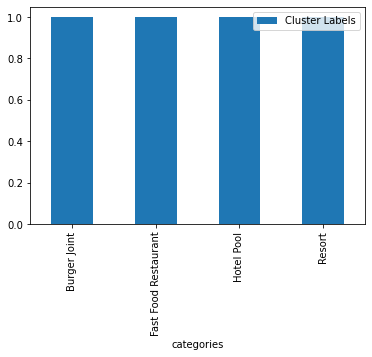

In [563]:
cluster_Sud0_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [564]:
cluster_Sud1=nearby_venues_Sud[nearby_venues_Sud['Cluster Labels']==1]
cluster_Sud1.head()

,Cluster Labels,name,categories,lat,lng
1,1,Gelée Beach,Beach,18.181293,-73.767581
3,1,Pointe Sable Beach,Beach,18.099404,-73.939159


In [565]:
cluster_Sud1_plot=cluster_Sud1.groupby('categories').count()
cluster_Sud1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Beach,2,2,2,2


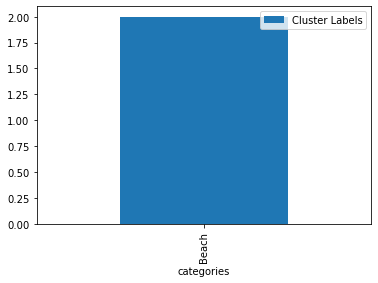

In [566]:
cluster_Sud1_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [567]:
nearby_venues_Sud2=nearby_venues_Sud.copy()
nearby_venues_Sud2['Cluster Labels']=nearby_venues_Sud2['Cluster Labels'].replace(0,'Food Venues')
nearby_venues_Sud2['Cluster Labels']=nearby_venues_Sud2['Cluster Labels'].replace(1,'Beach')
nearby_venues_Sud2.head()

,Cluster Labels,name,categories,lat,lng
0,Food Venues,Abaka Bay,Resort,18.094167,-73.702026
1,Beach,Gelée Beach,Beach,18.181293,-73.767581
2,Food Venues,Hot Spot,Fast Food Restaurant,18.204678,-73.756530
3,Beach,Pointe Sable Beach,Beach,18.099404,-73.939159
4,Food Venues,Pen Dore,Burger Joint,18.192869,-73.748329


In [568]:
# create map
Sud_map_clusters = folium.Map(location=[latitude_Sud, longitude_Sud], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##
    
for lat, lng, label, label2, activity in zip(df_Sud['Latitude'], df_Sud['Longitude'], df_Sud['Name'], df_Sud['Country Code'], df_Sud['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(Sud_map_clusters)  

Sud_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_Sud ['lat'], nearby_venues_Sud['lng'], nearby_venues_Sud['categories'], nearby_venues_Sud['Cluster Labels'], nearby_venues_Sud['name'], nearby_venues_Sud2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(Sud_map_clusters)       

Sud_map_clusters

# Sud-Est Department

In [569]:
df_SudEst= df_HaitiLoc_copy[df_HaitiLoc_copy['Department']=='SUD-EST'].reset_index(drop=True)
print(df_SudEst.shape)
df_SudEst.head()

(51, 9)


,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-14,SOGEBANK JACMEL,JACMEL,RUE LIBERTE,JACMEL,SUD-EST,0.000000,0.000000,1
1,HT1-38,SOGEXPRESS JACMEL,RUE NOZIRELE LHERISSON,,JACMEL,SUD-EST,0.000000,0.000000,1
2,HT1-104,PETER S SHOP,54 RUE STENIO VINCENT,,JACMEL,SUD-EST,18.234327,-72.532361,0
3,HT1-151,JEANTY BUREAU DE CHANGE,CAP ROUGE,,JACMEL,SUD-EST,0.000000,0.000000,1
4,HT1-152,PETER S SHOP MARIGOT,VALLEE DE JACMEL,,JACMEL,SUD-EST,18.268656,-72.665951,0


In [593]:
latitude_SudEst = 18.256703
longitude_SudEst = -72.520477 

In [571]:
map_Haiti_SudEst= folium.Map(location=[latitude_SudEst, longitude_SudEst], zoom_start=11)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_SudEst['Latitude'], df_SudEst['Longitude'], df_SudEst['Name'], df_SudEst['Country Code'], df_SudEst['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_SudEst)  
    
map_Haiti_SudEst

In [594]:
radius_SudEst = 10000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_SudEst, 
    longitude_SudEst, 
    radius_SudEst, 
    LIMIT)

In [595]:
Results_SudEst = requests.get(url_venues_Haiti).json()
Results_SudEst

{'meta': {'code': 200, 'requestId': '5fd6e3aa2e172d2de04f74d3'},
 'response': {'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 7,
  'suggestedBounds': {'ne': {'lat': 18.34670309000009,
    'lng': -72.42588334050951},
   'sw': {'lat': 18.166702909999913, 'lng': -72.61507065949048}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4f0f80b6e4b000502a18c204',
       'name': 'Hotel Cyvadier Restaurant, Jacmel',
       'location': {'lat': 18.224975889962582,
        'lng': -72.46704823637663,
        'labeledLatLngs': [{'label': 'display',
          'lat': 18.224975889962582,
          'lng': -72.46704823637663}],
        'distance': 6661,
        'cc': 'HT',
        'city': 'Jamel',


In [596]:
SudEst_Venues = Results_SudEst ['response']['groups'][0]['items']
nearby_venues_SudEst = json_normalize(SudEst_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_SudEst = nearby_venues_SudEst.loc[:,filtered_columns]

nearby_venues_SudEst ['venue.categories'] = nearby_venues_SudEst.apply(get_category_type, axis=1)

nearby_venues_SudEst.columns = [col.split(".")[-1] for col in nearby_venues_SudEst.columns]

print(nearby_venues_SudEst.shape)

nearby_venues_SudEst.head()

(7, 4)


<ipython-input-596-9988abf76cf7>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_SudEst = json_normalize(SudEst_Venues)


,name,categories,lat,lng
0,"Hotel Cyvadier Restaurant, Jacmel",Caribbean Restaurant,18.224976,-72.467048
1,Cap Lamandou Hotel,Hotel,18.224636,-72.526185
2,Hotel Florita,Hotel,18.233394,-72.536721
3,"Jacmel, Haiti",Airport Terminal,18.235721,-72.521422
4,Belvédère,Music Venue,18.234024,-72.534226


In [597]:
nearby_venues_SudEst.groupby('categories').count()

,name,lat,lng
categories,,,
Airport Terminal,1,1,1
Caribbean Restaurant,1,1,1
Hotel,3,3,3
Music Venue,1,1,1
Rock Climbing Spot,1,1,1


In [598]:
nearby_venues_SudEst.groupby('categories').count().shape

(5, 3)

In [599]:
print('There are {} unique categories.'.format(len(nearby_venues_SudEst['categories'].unique())))

There are 5 unique categories.


In [600]:
map_Haiti_SudEst_venues = folium.Map(location=[latitude_SudEst, longitude_SudEst], zoom_start=11)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_SudEst['Latitude'], df_SudEst['Longitude'], df_SudEst['Name'], df_SudEst['Country Code'], df_SudEst['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_SudEst_venues)  

for lat, lng, label in zip(nearby_venues_SudEst['lat'], nearby_venues_SudEst['lng'], nearby_venues_SudEst['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_SudEst_venues)  
      
map_Haiti_SudEst_venues.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )
        
map_Haiti_SudEst_venues

In [601]:
SudEst_onehot = pd.get_dummies(nearby_venues_SudEst[['categories']], prefix="", prefix_sep="")
SudEst_onehot.head()

,Airport Terminal,Caribbean Restaurant,Hotel,Music Venue,Rock Climbing Spot
0,0,1,0,0,0
1,0,0,1,0,0
2,0,0,1,0,0
3,1,0,0,0,0
4,0,0,0,1,0


In [603]:
distortions_SudEst = []
K = range(1,7)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(SudEst_onehot)
    distortions_SudEst.append(kmeanModel.inertia_)

<ipython-input-603-ae089af7bbea>:5: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  kmeanModel.fit(SudEst_onehot)


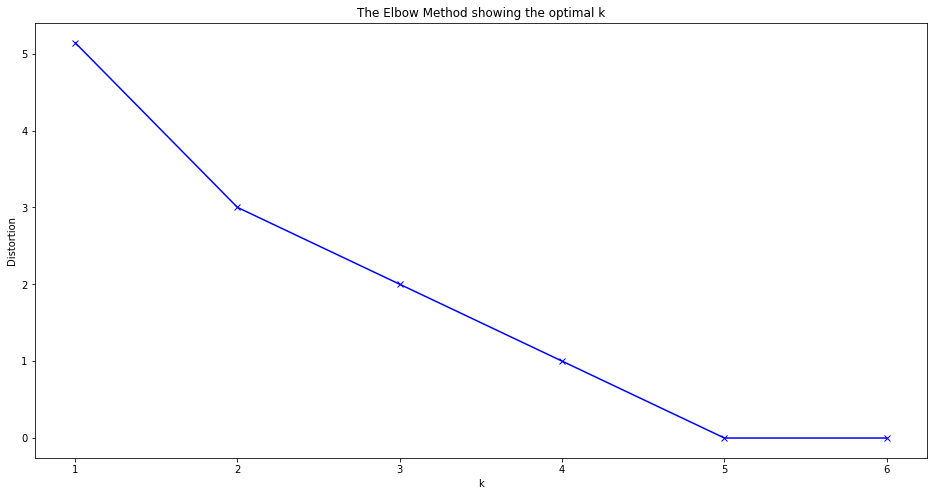

In [604]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_SudEst, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [605]:
kclusters = 2

SudEst_grouped_clustering = SudEst_onehot

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(SudEst_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 1, 1, 0, 0, 1, 0])

In [606]:
nearby_venues_SudEst.insert(0, 'Cluster Labels', kmeans.labels_)
nearby_venues_SudEst.head()

,Cluster Labels,name,categories,lat,lng
0,0,"Hotel Cyvadier Restaurant, Jacmel",Caribbean Restaurant,18.224976,-72.467048
1,1,Cap Lamandou Hotel,Hotel,18.224636,-72.526185
2,1,Hotel Florita,Hotel,18.233394,-72.536721
3,0,"Jacmel, Haiti",Airport Terminal,18.235721,-72.521422
4,0,Belvédère,Music Venue,18.234024,-72.534226


In [607]:
cluster_SudEst0=nearby_venues_SudEst[nearby_venues_SudEst['Cluster Labels']==0]
cluster_SudEst0.head()

,Cluster Labels,name,categories,lat,lng
0,0,"Hotel Cyvadier Restaurant, Jacmel",Caribbean Restaurant,18.224976,-72.467048
3,0,"Jacmel, Haiti",Airport Terminal,18.235721,-72.521422
4,0,Belvédère,Music Venue,18.234024,-72.534226
6,0,Bassin Bleu,Rock Climbing Spot,18.234739,-72.583125


In [608]:
cluster_SudEst0_plot=cluster_SudEst0.groupby('categories').count()
cluster_SudEst0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Airport Terminal,1,1,1,1
Caribbean Restaurant,1,1,1,1
Music Venue,1,1,1,1
Rock Climbing Spot,1,1,1,1


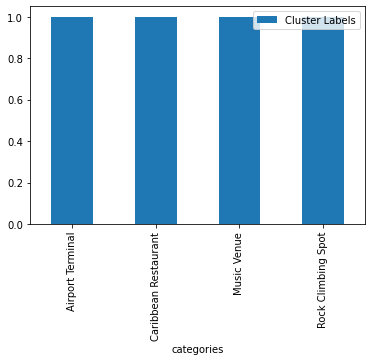

In [609]:
cluster_SudEst0_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [610]:
cluster_SudEst1=nearby_venues_SudEst[nearby_venues_SudEst['Cluster Labels']==1]
cluster_SudEst1.head()

,Cluster Labels,name,categories,lat,lng
1,1,Cap Lamandou Hotel,Hotel,18.224636,-72.526185
2,1,Hotel Florita,Hotel,18.233394,-72.536721
5,1,"Hotel Cyvadjier, Jacmel, Haiti",Hotel,18.225071,-72.466962


In [611]:
cluster_SudEst1_plot=cluster_SudEst1.groupby('categories').count()
cluster_SudEst1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Hotel,3,3,3,3


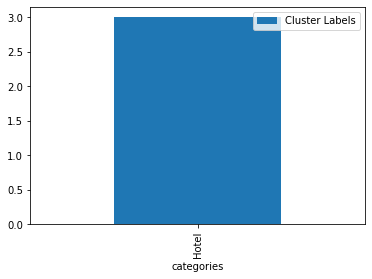

In [612]:
cluster_SudEst1_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [613]:
nearby_venues_SudEst2=nearby_venues_SudEst.copy()
nearby_venues_SudEst2['Cluster Labels']=nearby_venues_SudEst2['Cluster Labels'].replace(0,'Restaurants and Outdoors activity')
nearby_venues_SudEst2['Cluster Labels']=nearby_venues_SudEst2['Cluster Labels'].replace(1,'Hotels')
nearby_venues_SudEst2.head()

,Cluster Labels,name,categories,lat,lng
0,Restaurants and Outdoors activity,"Hotel Cyvadier Restaurant, Jacmel",Caribbean Restaurant,18.224976,-72.467048
1,Hotels,Cap Lamandou Hotel,Hotel,18.224636,-72.526185
2,Hotels,Hotel Florita,Hotel,18.233394,-72.536721
3,Restaurants and Outdoors activity,"Jacmel, Haiti",Airport Terminal,18.235721,-72.521422
4,Restaurants and Outdoors activity,Belvédère,Music Venue,18.234024,-72.534226


In [614]:
# create map
SudEst_map_clusters = folium.Map(location=[latitude_SudEst, longitude_SudEst], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##
    
for lat, lng, label, label2, activity in zip(df_SudEst['Latitude'], df_SudEst['Longitude'], df_SudEst['Name'], df_SudEst['Country Code'], df_SudEst['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(SudEst_map_clusters)  

SudEst_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_SudEst ['lat'], nearby_venues_SudEst['lng'], nearby_venues_SudEst['categories'], nearby_venues_SudEst['Cluster Labels'], nearby_venues_SudEst['name'], nearby_venues_SudEst2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(SudEst_map_clusters)       

SudEst_map_clusters